# NFT 이미지 유사도 검증 API 테스트

## 함수 정의

In [83]:
import os
import random
import requests
import base64
from PIL import Image
from io import BytesIO

def encode_image_to_base64(img_filepath):
    with open(img_filepath, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')
    
def test_check_and_register(img_filepath):
    img_base64 = encode_image_to_base64(img_filepath)
    data = {"img_file": img_base64}
    response = requests.post("http://localhost:8000/check_and_register/", json=data)
    print(response.json())
    return response.json()

def test_force_register(img_filepath):
    img_base64 = encode_image_to_base64(img_filepath)
    data = {"img_file": img_base64}
    response = requests.post("http://localhost:8000/force_register/", json=data)
    print(response.json())
    return response.json()

def test_only_check(img_filepath):
    img_base64 = encode_image_to_base64(img_filepath)
    data = {"img_file": img_base64}
    response = requests.post("http://localhost:8000/only_check/", json=data)
    print(response.json())
    return response.json()
    
def test_reset():
    response = requests.post("http://localhost:8000/reset/")
    print(response.json())

In [84]:
orig_sample_path = "nft_images/sample_data/originImage"
orig_sample_list = [f for f in os.listdir(orig_sample_path) if f.endswith('.png') or f.endswith('.jpg')]

In [85]:
print(orig_sample_list)

['34_Baseball_Baseball_34_109.jpg', '34_Baseball_Baseball_34_11.jpg', '34_Baseball_Baseball_34_111.jpg', '34_Baseball_Baseball_34_115.jpg', '34_Baseball_Baseball_34_119.jpg', '34_Baseball_Baseball_34_124.jpg', '34_Baseball_Baseball_34_126.jpg', '34_Baseball_Baseball_34_20.jpg', '34_Baseball_Baseball_34_40.jpg', '34_Baseball_Baseball_34_42.jpg', '34_Baseball_Baseball_34_46.jpg', '34_Baseball_Baseball_34_5.jpg', '34_Baseball_Baseball_34_59.jpg', '34_Baseball_Baseball_34_67.jpg', '34_Baseball_Baseball_34_69.jpg', '34_Baseball_Baseball_34_71.jpg', '34_Baseball_Baseball_34_86.jpg', '34_Baseball_Baseball_34_88.jpg', '34_Baseball_Baseball_34_90.jpg', '34_Baseball_Baseball_34_92.jpg']


In [94]:
orig_sample_cid_list = []

for i in range(len(orig_sample_list)):
    orig_sample_ind_path = os.path.join(orig_sample_path, orig_sample_list[i])
    orig_sample_result = test_force_register(orig_sample_ind_path)
    orig_sample_cid_list.append(orig_sample_result["new_img_cid"])

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw'}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': 'QmSNpY82DX4S4NjRyfxNCxcKmAevWnghtqPZcCeQumTouS'}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf'}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': 'Qmdk5nAPFgUG35gd6AtiNZaW4jmU7xy58uPcqSAU5ajpjJ'}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': 'QmcUABREtgK8qZ3nhbsU3ULqdLEDfsTwxRb9eJurpVwQfN'}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': 'QmRH6tVef1QUYiaHCVV2QbATEAhpHrAu1FWuFqfTotcBKm'}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': 

In [95]:
print(orig_sample_cid_list)

['QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'QmSNpY82DX4S4NjRyfxNCxcKmAevWnghtqPZcCeQumTouS', 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'Qmdk5nAPFgUG35gd6AtiNZaW4jmU7xy58uPcqSAU5ajpjJ', 'QmcUABREtgK8qZ3nhbsU3ULqdLEDfsTwxRb9eJurpVwQfN', 'QmRH6tVef1QUYiaHCVV2QbATEAhpHrAu1FWuFqfTotcBKm', 'QmT74kQusKZfhSD3GpgLhaphcAQP2hHCCaWjTFFptzBXAy', 'QmWWGSASW2Yq2sR7Fv1SaWgceBeNpdGK4eLRxuBN4P7bPW', 'QmSiSAxFVsujVY497ZnMMMxuEL3JhErxddi1D5APAgvwNM', 'QmamLhtU7T8avZeLK1TqUj3kf5MfSbm4KZQZ6zF89x4J9K', 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'QmSwwCH7XMLrg93w6TRbfhputYsFbNBxGBKHmfjFWZMxFj', 'QmdptcRRHaNYwcT54ksb3DAuyQeUVBXPijAqYqdcHrmMgJ', 'QmQNeohE1NqXmFgavQjNdosPTCzrc1qCHLtrNbPLsKcMsy', 'QmZRbG12Q3Hosbgmu3kJWvDLxQdZgbCZdGdTTsXriYkYNa', 'QmawRZ3pr1DJsmWZhL1rERyZDKtWxews1r7QjsR2XZmSEp', 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'QmehH9XrhQt1vL6cWzbTikQkE4oNYtH25f1JPc8sLu6A13', 'QmdsRquSH5EHXbcXdBtPYrXRJicbnpfzxsGAZNxed5LCsH', 'QmPUtvvWcir9fLxow5BcX3kpgqgB1CCGJqz6uJyMFKZkPt']

In [104]:
chk_dict = {}
wrong_index_list_dict = {}

for i in range(25):
    atk_sample_path = f"nft_images/sample_data/attackImage/{i + 1}percent"
    atk_sample_list = [f for f in os.listdir(atk_sample_path) if f.endswith('.png') or f.endswith('.jpg')]
    chk = 0
    wrong_index_list = []
    
    for j in range(len(atk_sample_list)):
        atk_sample_ind_path = os.path.join(atk_sample_path, atk_sample_list[j])
        atk_sample_result = test_only_check(atk_sample_ind_path)
        if atk_sample_result["orig_img_cid"] == orig_sample_cid_list[j]:
            chk += 1
        else:
            wrong_index_list.append(j)
            
    chk_dict[i] = chk
    wrong_index_list_dict[i] = wrong_index_list

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmcUABREtgK8qZ3nhbsU3ULqdLEDfsTwxRb9eJurpVwQfN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAgABAwQFBgcI/8QAQxAAAQMCBAQEAwYEBQMCBwAAAQACAwQRBRIhMQZBUWETFCJxMoGRB0JSobHBFSNi0TNDcoLhFqLwJFMlNFRjkrLx/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EACoRAQEAAgICAgICAQMFAAAAAAABAhEDEgQhFDETQSJRMjNhcQUjQoHR/9oADAMBAAIRAxEAPwDy9qYohsmK954Jgn5JJKASknTKaUgnTJ00FySSSV0hkkk6BJk6YqUgmb9FMb5VE1SHbe6x0zlByJQKTla6BWRjRM0KlBCibupAspGO0gdb2SLtN0BKV00syHcm9gonm5R303UZSQt2FGNtEHNSN2RIYd04PdK1h3TIuz7puemiV0Q200RDWTItEJVQyRSSVQyJoB3TAaqUC26ijY1O4ckgbc0r3v1UbJr6QuSYPUnduU7BqFlI1X7TtHpTmyYOsmzK6W2HI0KhcdEbjpuoysowvs7N1aZsqrd1Za6wCljZx3Q72TWQ5xtZFm7LHTPcogLIrjoo84BTF9humk7RmBIpBIp+mJkk6EqKSSdMUDJ0yJQJJJJUMlzTpIEmSSUsBNRHW6ZuydXSUKSdJTQdqNC1Os5GNJJ

{'plagiarism': True, 'orig_img_cid': 'QmT74kQusKZfhSD3GpgLhaphcAQP2hHCCaWjTFFptzBXAy', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIEBAMHBAIBBAMAAQIRAAMhBBIxBUETIlFhBjJxgRSRoSNCUrHB0fAHFTPhYvFyFiRDY4KSwv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAmEQACAgICAgMAAgMBAAAAAAAAAQIRAyESMQRBEyJRMmEUI3FC/9oADAMBAAIRAxEAPwAK7IPMniKch2rDSDxS7kVRHNGW+kjcBXHLhiBTgmKRx5SoM0Zmt3SWED6CuCqilgVz7VIYBQFyx+9OAAfDd6di6x4AFL4QxDbiM0hFhpr+5dhyR2oeqsPuLrUJLzW3mDVvZv29Qm0jMVdFqapkeiqBIPyzT1uRgjk0XVWmsuSPlNBU5zBmqmuLoa2GW2gYEHPemOm0bgST6UoKq4aZ+1HGpQnjP0oGQQ5JyKIF8oM89qkb7bEsRmhvcWQR60qAGCVO5VkCmtcLv8oFSdqOpIePakt27EsHcz2p1+ADTIPH50wyMifepq2NMLYYMSYoRNrgc/WigAr4lwYmu8K8YPh4o1sqomTNTEclYKMR9qEkFFaNyGIMzmjKFw2SfpUwWd74tjPrXNpnsySmP/GpJBQL8O2oteRQfcgzUG/pGtO

{'plagiarism': True, 'orig_img_cid': 'QmSiSAxFVsujVY497ZnMMMxuEL3JhErxddi1D5APAgvwNM', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QARxAAAgEDAwIFAgMGBAMFBgcAAQIRAAMhBBIxBUEGEyJRYXGBFDKRFSNCobHwB1LB0TNi4RZDcoLxJFNjc5KiFyUmNUSDsv/EABoBAQEAAwEBAAAAAAAAAAAAAAABAgMEBQb/xAArEQACAgEDBAIBBAMBAQAAAAAAAQIRAwQSIRMxQVEUIgUyQlJhI4GhcTP/2gAMAwEAAhEDEQA/APJx0DVKZXTaifhDTn6dr29d+1qWMQCyHAr6hPSenkfuxbFC3TE2lUW0wPvWNMp8y6SxcsW7Z8m6WUxOw8VsU1iIsOCCsgAg19BDQeQIOhtOPiKQ+l0Tf8XpKH/yA1hLGmwfOtzWOtq4EjcxkUrS9T1mjY3EKlziK+h26V0O43q6PbB/+UKE9B8PPg9JtD/+qqoJFtnzr1TqGs6pbVLm0bTOK1p0V3b+YTX00fCvhy4sfsu2P/JSP+wvhxl//b0H0BrJE7nzSdHeBxFCdHd52j9a+kG/w88PNP8A7H/Wkt/hn0Fhiyw+5q8kPnmzprqXFYrirzm55dyBlq90H+FXRW7OB/4qh/8ACjojCLbXA3vurHbfJT5+fT3m5BMClPp3Foek7q6jrvSP2d1zWaS3dJS

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'QmdptcRRHaNYwcT54ksb3DAuyQeUVBXPijAqYqdcHrmMgJ', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAQhAAAQMCBAQDBQYEBQQBBQAAAQACAwQRBRIhMQYTQVEiYXEUMlKBkQcVI0KhsRYzwdEkQ2Jy4VOC8PE0FyVjksL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBQEAAgMAAAAAAAECEQMEEiExE1FBBRQVIjJhI1JCgfH/2gAMAwEAAhEDEQA/APJoHuBvqVb08rjZV9PGNLqyibYCwWTKRYxuzNUc1mtTOZlZoVBJP0KlIdkRN3KCUaXCeXjdRPdcKkIhLvNPa4KJ3dMzm6oQW1wuFYU1VlcFSh5upWyO6JNWFml9vBba6TncwKlgc4kbq2pm7EqKoqwgR2F1E/QInS2qGl1KYiEutugp3kAlGZblDVMRLLBCABZN49FcUfiVLFC5slrFXtEwgC6t9EhoYonssUUBsopbLIv4IEUw+AIW1yi42EhZZnwVEDrD+GVXK8monSt6oc4RJ5rbBqcUY02ZZMcm+CrC6ytm4Sbag3UUmGSNvYLdavC3SZHikVy4C6NGHTHWyJpsON/EE56rHFXYljk2VWR3Yp7IXuNrFaaHDWOGoCV1DHG7YLgf1bHe1dm3277KWHDS/e6n+5i

{'plagiarism': True, 'orig_img_cid': 'QmZRbG12Q3Hosbgmu3kJWvDLxQdZgbCZdGdTTsXriYkYNa', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgMBAQEBAAAAAAAAAAAAAgMAAQQFBgcI/8QAPxAAAgEDAwIEAwYFAwQBBQEBAQIRAAMhBBIxBUETIlFhBnGBFDKRobHwByNCwdEzUuEVYnLxJEOCkqKywtL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBAIDAQEAAAAAAAECEQMEEiExQVETFCJhcQUyFUJSI0P/2gAMAwEAAhEDEQA/AOoYNUQJppVeQKIWpyRAFeRZNGcxOaoRwK1CzJkDFTwShkrzTsNpn9ajADjuKc1v2oRbJ7cUDoTtEVQUCMU8bQYYVCqduaQqFKhJwPrVBIORTQOYNEu0jNOwoQUIqC2T3imnnFXtHc0DF7CIBNX93HNMCjk1GjtQOwJxUBng1RtkiQYNQJEE0WLczx/8Sde2m+HrelBg6m5n/wAVz+sV8dOXr6X8farRdV6k3Tla9b12jQ7N0bLsiSvqDHB7189fQ37ehta5kixddraN/uKgT+or0sKqC/I7tn2P+Gmn2fDOk2iEvG7dusOZ3bR9fKKc3wV0/TdY0Nm1pr401tbl+8+45uGAmT9TXD/h1oPi/X9JROmX9PpenWbpIu31kkkgmB3GPzr6Lq+na7ReGNZ1u9fv3LTKkWwqK0g

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmdsRquSH5EHXbcXdBtPYrXRJicbnpfzxsGAZNxed5LCsH', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwABAgQFBgcI/8QAPxAAAgECBAQEBAMHAwQBBQAAAQIRAAMEEiExBRNBUQYiYXEUMoGRB0KhFSNSscHR4RYzYiRTcoIXJaKy8PH/xAAbAQEBAAMBAQEAAAAAAAAAAAAAAQIDBAUGB//EACkRAAICAgEEAgMBAAIDAAAAAAABAhEDEiEEFDFRE0EFIjJhFUJScZH/2gAMAwEAAhEDEQA/AMxLgnWillIqkVIIiakoavLo0B8wM0+UNtQoIE9aSuRSihSgFNlFDZzUS5ilAsZBTcuq4umpC+wFKAfJGoqaCq3xBmkMRUohdVRT5RNUziSKn8ToKUXgt8sRTcsTVVcWQSKKL89alAILWlOLVDOIikMROgNOQG5SgipfDrvVc3jmABpjiGBilMcFkWATT8haqfFlaf4xtzVpjgtfDAdqYWFg0AY0HQmojGTOtKY4LAsKKlyVqv8AGKDS+MUECrTLwWreEa4wVFLMToAKHewb2Lpt3Ue243VgQa9K8E4bBW8AMQIbEOQpJjynsKu+OcHhMVwG9iLgUXsOM9u519V9jWxY1rdmx42lyeSi0I9acWpNDOIUVNMSkzWNGoJyFy03JWaXxAgxUBigd6lAlywGFO8Zd96kLqQSTVd

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmcUABREtgK8qZ3nhbsU3ULqdLEDfsTwxRb9eJurpVwQfN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAgABAwQFBgcI/8QAQxAAAQMCBAQEAwYEBQMCBwAAAQACAwQRBRIhMQZBUWETFCJxMoGRB0JSobHBFSNi0TNDcoLhFqLwJFMlNFRjkrLx/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EACoRAQEAAgICAgICAQMFAAAAAAABAhEDEgQhFDETQSJRMjNhcQUjQoHR/9oADAMBAAIRAxEAPwDy9qYohsmK954Jgn5JJKASknTKaUgnTJ00FySSSV0hkkk6BJk6YqUgmb9FMb5VE1SHbe6x0zlByJQKTla6BWRjRM0KlBCibupAspGO0gdb2SLtN0BKV00syHcm9gonm5R303UZSQt2FGNtEHNSN2RIYd04PdK1h3TIuz7puemiV0Q200RDWTItEJVQyRSSVQyJoB3TAaqUC26ijY1O4ckgbc0r3v1UbJr6QuSYPUnduU7BqFlI1X7TtHpTmyYOsmzK6W2HI0KhcdEbjpuoysowvs7N1aZsqrd1Za6wCljZx3Q72TWQ5xtZFm7LHTPcogLIrjoo84BTF9humk7RmBIpBIp+mJkk6EqKSSdMUDJ0yJQJJJJUMlzTpIEmSSUsBNRHW6ZuydXSUKSdJTQdqNC1Os5GNJJ

{'plagiarism': True, 'orig_img_cid': 'QmT74kQusKZfhSD3GpgLhaphcAQP2hHCCaWjTFFptzBXAy', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIEBAMHBAIBBAMAAQIRAAMhBBIxBUETIlFhBjJxgRSRoSNCUrHB0fAHFTPhYvFyFiRDY4KSwv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAmEQACAgICAgMAAgMBAAAAAAAAAQIRAyESMQRBEyJRMmEUI3FC/9oADAMBAAIRAxEAPwAK7IPMniKch2rDSDxS7kVRHNGW+kjcBXHLhiBTgmKRx5SoM0Zmt3SWED6CuCqilgVz7VIYBQFyx+9OAAfDd6di6x4AFL4QxDbiM0hFhpr+5dhyR2oeqsPuLrUJLzW3mDVvZv29Qm0jMVdFqapkeiqBIPyzT1uRgjk0XVWmsuSPlNBU5zBmqmuLoa2GW2gYEHPemOm0bgST6UoKq4aZ+1HGpQnjP0oGQQ5JyKIF8oM89qkb7bEsRmhvcWQR60qAGCVO5VkCmtcLv8oFSdqOpIePakt27EsHcz2p1+ADTIPH50wyMifepq2NMLYYMSYoRNrgc/WigAr4lwYmu8K8YPh4o1sqomTNTEclYKMR9qEkFFaNyGIMzmjKFw2SfpUwWd74tjPrXNpnsySmP/GpJBQL8O2oteRQfcgzUG/pGtO

{'plagiarism': True, 'orig_img_cid': 'QmSiSAxFVsujVY497ZnMMMxuEL3JhErxddi1D5APAgvwNM', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QARxAAAgEDAwIFAgMGBAMFBgcAAQIRAAMhBBIxBUEGEyJRYXGBFDKRFSNCobHwB1LB0TNi4RZDcoLxJFNjc5KiFyUmNUSDsv/EABoBAQEAAwEBAAAAAAAAAAAAAAABAgMEBQb/xAArEQACAgEDBAIBBAMBAQAAAAAAAQIRAwQSIRMxQVEUIgUyQlJhI4GhcTP/2gAMAwEAAhEDEQA/APJx0DVKZXTaifhDTn6dr29d+1qWMQCyHAr6hPSenkfuxbFC3TE2lUW0wPvWNMp8y6SxcsW7Z8m6WUxOw8VsU1iIsOCCsgAg19BDQeQIOhtOPiKQ+l0Tf8XpKH/yA1hLGmwfOtzWOtq4EjcxkUrS9T1mjY3EKlziK+h26V0O43q6PbB/+UKE9B8PPg9JtD/+qqoJFtnzr1TqGs6pbVLm0bTOK1p0V3b+YTX00fCvhy4sfsu2P/JSP+wvhxl//b0H0BrJE7nzSdHeBxFCdHd52j9a+kG/w88PNP8A7H/Wkt/hn0Fhiyw+5q8kPnmzprqXFYrirzm55dyBlq90H+FXRW7OB/4qh/8ACjojCLbXA3vurHbfJT5+fT3m5BMClPp3Foek7q6jrvSP2d1zWaS3dJS

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'QmdptcRRHaNYwcT54ksb3DAuyQeUVBXPijAqYqdcHrmMgJ', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAQhAAAQMCBAQDBQYEBQQBBQAAAQACAwQRBRIhMQYTQVEiYXEUMlKBkQcVI0KhsRYzwdEkQ2Jy4VOC8PE0FyVjksL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBQEAAgMAAAAAAAECEQMEEiExE1FBBRQVIjJhI1JCgfH/2gAMAwEAAhEDEQA/APJoHuBvqVb08rjZV9PGNLqyibYCwWTKRYxuzNUc1mtTOZlZoVBJP0KlIdkRN3KCUaXCeXjdRPdcKkIhLvNPa4KJ3dMzm6oQW1wuFYU1VlcFSh5upWyO6JNWFml9vBba6TncwKlgc4kbq2pm7EqKoqwgR2F1E/QInS2qGl1KYiEutugp3kAlGZblDVMRLLBCABZN49FcUfiVLFC5slrFXtEwgC6t9EhoYonssUUBsopbLIv4IEUw+AIW1yi42EhZZnwVEDrD+GVXK8monSt6oc4RJ5rbBqcUY02ZZMcm+CrC6ytm4Sbag3UUmGSNvYLdavC3SZHikVy4C6NGHTHWyJpsON/EE56rHFXYljk2VWR3Yp7IXuNrFaaHDWOGoCV1DHG7YLgf1bHe1dm3277KWHDS/e6n+5i

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmPUtvvWcir9fLxow5BcX3kpgqgB1CCGJqz6uJyMFKZkPt', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQxAAAgEDAgQEBQIEBAUDAwUBAQIDAAQREiEFEzFBIlFhcQYUMoGRQqEjUrHBFTNi0Qdy4fDxJENTNIKSFiZEc6LS/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EAC8RAQACAgEDBAEDAgYDAAAAAAABEQIDIQQSMRMUQVEiMmFxM7FCgZGhweEjYtH/2gAMAwEAAhEDEQA/AKfpmswCazHcGowwFfPvoxHAAFQwwKjDN2qSpxQYFB6HFEVGNqhVON9qnH3oBCd96nB86kBj0NTpOPWgjbzqCARRBcdRipA9qAcYXasxTBv22FQwB7UADFYQTuDRaABUqlACjfBqSPIURAzU6fI0AYwKgBT12pmCKwrkdKgAoMAdajRgbGjCGp0mqFkZrAmN80zFZpIGc0Czg7EVgUYzRFalR5UAjpvQgCm6fSs0Z3xQLx5msyAKMR5O9ToAFArOdqg03SD2qdODtilhC9elFgim6d+lRg5oF6R3FRnO3S

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmcUABREtgK8qZ3nhbsU3ULqdLEDfsTwxRb9eJurpVwQfN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAgABAwQFBgcI/8QAQxAAAQMCBAQEAwYEBQMCBwAAAQACAwQRBRIhMQZBUWETFCJxMoGRB0JSobHBFSNi0TNDcoLhFqLwJFMlNFRjkrLx/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EACoRAQEAAgICAgICAQMFAAAAAAABAhEDEgQhFDETQSJRMjNhcQUjQoHR/9oADAMBAAIRAxEAPwDy9qYohsmK954Jgn5JJKASknTKaUgnTJ00FySSSV0hkkk6BJk6YqUgmb9FMb5VE1SHbe6x0zlByJQKTla6BWRjRM0KlBCibupAspGO0gdb2SLtN0BKV00syHcm9gonm5R303UZSQt2FGNtEHNSN2RIYd04PdK1h3TIuz7puemiV0Q200RDWTItEJVQyRSSVQyJoB3TAaqUC26ijY1O4ckgbc0r3v1UbJr6QuSYPUnduU7BqFlI1X7TtHpTmyYOsmzK6W2HI0KhcdEbjpuoysowvs7N1aZsqrd1Za6wCljZx3Q72TWQ5xtZFm7LHTPcogLIrjoo84BTF9humk7RmBIpBIp+mJkk6EqKSSdMUDJ0yJQJJJJUMlzTpIEmSSUsBNRHW6ZuydXSUKSdJTQdqNC1Os5GNJJ

{'plagiarism': True, 'orig_img_cid': 'QmT74kQusKZfhSD3GpgLhaphcAQP2hHCCaWjTFFptzBXAy', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIEBAMHBAIBBAMAAQIRAAMhBBIxBUETIlFhBjJxgRSRoSNCUrHB0fAHFTPhYvFyFiRDY4KSwv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAmEQACAgICAgMAAgMBAAAAAAAAAQIRAyESMQRBEyJRMmEUI3FC/9oADAMBAAIRAxEAPwAK7IPMniKch2rDSDxS7kVRHNGW+kjcBXHLhiBTgmKRx5SoM0Zmt3SWED6CuCqilgVz7VIYBQFyx+9OAAfDd6di6x4AFL4QxDbiM0hFhpr+5dhyR2oeqsPuLrUJLzW3mDVvZv29Qm0jMVdFqapkeiqBIPyzT1uRgjk0XVWmsuSPlNBU5zBmqmuLoa2GW2gYEHPemOm0bgST6UoKq4aZ+1HGpQnjP0oGQQ5JyKIF8oM89qkb7bEsRmhvcWQR60qAGCVO5VkCmtcLv8oFSdqOpIePakt27EsHcz2p1+ADTIPH50wyMifepq2NMLYYMSYoRNrgc/WigAr4lwYmu8K8YPh4o1sqomTNTEclYKMR9qEkFFaNyGIMzmjKFw2SfpUwWd74tjPrXNpnsySmP/GpJBQL8O2oteRQfcgzUG/pGtO

{'plagiarism': True, 'orig_img_cid': 'QmSiSAxFVsujVY497ZnMMMxuEL3JhErxddi1D5APAgvwNM', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QARxAAAgEDAwIFAgMGBAMFBgcAAQIRAAMhBBIxBUEGEyJRYXGBFDKRFSNCobHwB1LB0TNi4RZDcoLxJFNjc5KiFyUmNUSDsv/EABoBAQEAAwEBAAAAAAAAAAAAAAABAgMEBQb/xAArEQACAgEDBAIBBAMBAQAAAAAAAQIRAwQSIRMxQVEUIgUyQlJhI4GhcTP/2gAMAwEAAhEDEQA/APJx0DVKZXTaifhDTn6dr29d+1qWMQCyHAr6hPSenkfuxbFC3TE2lUW0wPvWNMp8y6SxcsW7Z8m6WUxOw8VsU1iIsOCCsgAg19BDQeQIOhtOPiKQ+l0Tf8XpKH/yA1hLGmwfOtzWOtq4EjcxkUrS9T1mjY3EKlziK+h26V0O43q6PbB/+UKE9B8PPg9JtD/+qqoJFtnzr1TqGs6pbVLm0bTOK1p0V3b+YTX00fCvhy4sfsu2P/JSP+wvhxl//b0H0BrJE7nzSdHeBxFCdHd52j9a+kG/w88PNP8A7H/Wkt/hn0Fhiyw+5q8kPnmzprqXFYrirzm55dyBlq90H+FXRW7OB/4qh/8ACjojCLbXA3vurHbfJT5+fT3m5BMClPp3Foek7q6jrvSP2d1zWaS3dJS

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'QmdptcRRHaNYwcT54ksb3DAuyQeUVBXPijAqYqdcHrmMgJ', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAQhAAAQMCBAQDBQYEBQQBBQAAAQACAwQRBRIhMQYTQVEiYXEUMlKBkQcVI0KhsRYzwdEkQ2Jy4VOC8PE0FyVjksL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBQEAAgMAAAAAAAECEQMEEiExE1FBBRQVIjJhI1JCgfH/2gAMAwEAAhEDEQA/APJoHuBvqVb08rjZV9PGNLqyibYCwWTKRYxuzNUc1mtTOZlZoVBJP0KlIdkRN3KCUaXCeXjdRPdcKkIhLvNPa4KJ3dMzm6oQW1wuFYU1VlcFSh5upWyO6JNWFml9vBba6TncwKlgc4kbq2pm7EqKoqwgR2F1E/QInS2qGl1KYiEutugp3kAlGZblDVMRLLBCABZN49FcUfiVLFC5slrFXtEwgC6t9EhoYonssUUBsopbLIv4IEUw+AIW1yi42EhZZnwVEDrD+GVXK8monSt6oc4RJ5rbBqcUY02ZZMcm+CrC6ytm4Sbag3UUmGSNvYLdavC3SZHikVy4C6NGHTHWyJpsON/EE56rHFXYljk2VWR3Yp7IXuNrFaaHDWOGoCV1DHG7YLgf1bHe1dm3277KWHDS/e6n+5i

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmdsRquSH5EHXbcXdBtPYrXRJicbnpfzxsGAZNxed5LCsH', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwABAgQFBgcI/8QAPxAAAgECBAQEBAMHAwQBBQAAAQIRAAMEEiExBRNBUQYiYXEUMoGRB0KhFSNSscHR4RYzYiRTcoIXJaKy8PH/xAAbAQEBAAMBAQEAAAAAAAAAAAAAAQIDBAUGB//EACkRAAICAgEEAgMBAAIDAAAAAAABAhEDEiEEFDFRE0EFIjJhFUJScZH/2gAMAwEAAhEDEQA/AMxLgnWillIqkVIIiakoavLo0B8wM0+UNtQoIE9aSuRSihSgFNlFDZzUS5ilAsZBTcuq4umpC+wFKAfJGoqaCq3xBmkMRUohdVRT5RNUziSKn8ToKUXgt8sRTcsTVVcWQSKKL89alAILWlOLVDOIikMROgNOQG5SgipfDrvVc3jmABpjiGBilMcFkWATT8haqfFlaf4xtzVpjgtfDAdqYWFg0AY0HQmojGTOtKY4LAsKKlyVqv8AGKDS+MUECrTLwWreEa4wVFLMToAKHewb2Lpt3Ue243VgQa9K8E4bBW8AMQIbEOQpJjynsKu+OcHhMVwG9iLgUXsOM9u519V9jWxY1rdmx42lyeSi0I9acWpNDOIUVNMSkzWNGoJyFy03JWaXxAgxUBigd6lAlywGFO8Zd96kLqQSTVd

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmRH6tVef1QUYiaHCVV2QbATEAhpHrAu1FWuFqfTotcBKm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgMBAQEBAAAAAAAAAAAABAUCAwYBBwAI/8QAPhAAAgEDAwIFAgQEBAUFAAMAAQIDAAQRBRIhMUEGEyJRYTJxFCOBkQdCobEVUmLBFiQz0eFDcoKS8Bc08f/EABkBAAIDAQAAAAAAAAAAAAAAAAECAAMEBf/EAC0RAAICAQQCAgEDBAIDAAAAAAABAhEDBBIhMRNBIlFhIzJCBRRxgTNDUqHB/9oADAMBAAIRAxEAPwDwOU5lc+7GmGkczuvxQlxbtCcnoTxR+lQkXEjA5CgCoAY4xMR8CqHV2uXCtjbGSKKIPn/oKXT3BTVtv8uzZ+9K+h4fuQHFL+HvwSchuDTonHSs5I3/ADBY9jWgDrJGrocgiiCXZYHy9EKAQKBU+sUdGMqPgVGAkVru3IFTAGAKkFyKUhU6DFQtk3LMPdjRMi8CqbclEmIHIY0yVkMzeBjcsuCMnmmukoCmMVEQC/kVthAGdx9zRGmFY52hY4IPFBJ0NJpsaLH0+1dKbQT7VeFyMiuFcjFQQwcs8hmdsnO8nNMp7G9njS

{'plagiarism': True, 'orig_img_cid': 'QmT74kQusKZfhSD3GpgLhaphcAQP2hHCCaWjTFFptzBXAy', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIEBAMHBAIBBAMAAQIRAAMhBBIxBUETIlFhBjJxgRSRoSNCUrHB0fAHFTPhYvFyFiRDY4KSwv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAmEQACAgICAgMAAgMBAAAAAAAAAQIRAyESMQRBEyJRMmEUI3FC/9oADAMBAAIRAxEAPwAK7IPMniKch2rDSDxS7kVRHNGW+kjcBXHLhiBTgmKRx5SoM0Zmt3SWED6CuCqilgVz7VIYBQFyx+9OAAfDd6di6x4AFL4QxDbiM0hFhpr+5dhyR2oeqsPuLrUJLzW3mDVvZv29Qm0jMVdFqapkeiqBIPyzT1uRgjk0XVWmsuSPlNBU5zBmqmuLoa2GW2gYEHPemOm0bgST6UoKq4aZ+1HGpQnjP0oGQQ5JyKIF8oM89qkb7bEsRmhvcWQR60qAGCVO5VkCmtcLv8oFSdqOpIePakt27EsHcz2p1+ADTIPH50wyMifepq2NMLYYMSYoRNrgc/WigAr4lwYmu8K8YPh4o1sqomTNTEclYKMR9qEkFFaNyGIMzmjKFw2SfpUwWd74tjPrXNpnsySmP/GpJBQL8O2oteRQfcgzUG/pGtO

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'QmdptcRRHaNYwcT54ksb3DAuyQeUVBXPijAqYqdcHrmMgJ', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAQhAAAQMCBAQDBQYEBQQBBQAAAQACAwQRBRIhMQYTQVEiYXEUMlKBkQcVI0KhsRYzwdEkQ2Jy4VOC8PE0FyVjksL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBQEAAgMAAAAAAAECEQMEEiExE1FBBRQVIjJhI1JCgfH/2gAMAwEAAhEDEQA/APJoHuBvqVb08rjZV9PGNLqyibYCwWTKRYxuzNUc1mtTOZlZoVBJP0KlIdkRN3KCUaXCeXjdRPdcKkIhLvNPa4KJ3dMzm6oQW1wuFYU1VlcFSh5upWyO6JNWFml9vBba6TncwKlgc4kbq2pm7EqKoqwgR2F1E/QInS2qGl1KYiEutugp3kAlGZblDVMRLLBCABZN49FcUfiVLFC5slrFXtEwgC6t9EhoYonssUUBsopbLIv4IEUw+AIW1yi42EhZZnwVEDrD+GVXK8monSt6oc4RJ5rbBqcUY02ZZMcm+CrC6ytm4Sbag3UUmGSNvYLdavC3SZHikVy4C6NGHTHWyJpsON/EE56rHFXYljk2VWR3Yp7IXuNrFaaHDWOGoCV1DHG7YLgf1bHe1dm3277KWHDS/e6n+5i

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmawRZ3pr1DJsmWZhL1rERyZDKtWxews1r7QjsR2XZmSEp', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGBwAI/8QAQBAAAgEDAwIFAwEGBQQCAQQDAQIDAAQRBRIhMUEGEyJRYRQycYEHFSNCkaEzUrHB0SRi4fAW8XJDgpKyFyVj/8QAGgEAAgMBAQAAAAAAAAAAAAAAAAECAwQFBv/EACYRAAICAgEFAAIDAQEAAAAAAAABAhEDEiEEEzFBUSJhFDJxBUL/2gAMAwEAAhEDEQA/AODP92O5rqHhzw/a33hyxmkUlipJ/rXLU5bJ5rtvgllbwraZIDLuXB/NV5W64JY0r5Ky68E2zwtJbyFXHRTVV/8AB7xwxD4roqxEyAZ61Mto7cAiqe5In2oM5h/8Kv2BAI6VIPAOoKBuIGRmulvYNGrMpPTNGQobpEdRk4Ao7sq5F2YN8HJ5fA14m31DpUR8GX4GRgiuuyaY0resED4qEaZPHlVXIp95h2I/DkZ8G6kVL7CcU2TwvqcWVMLZrrw064TAOQCeRU09nKZW9OQQO1NZ/on06OGzaRewE74WzULWVzjPktj8V2ldEe

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmdsRquSH5EHXbcXdBtPYrXRJicbnpfzxsGAZNxed5LCsH', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwABAgQFBgcI/8QAPxAAAgECBAQEBAMHAwQBBQAAAQIRAAMEEiExBRNBUQYiYXEUMoGRB0KhFSNSscHR4RYzYiRTcoIXJaKy8PH/xAAbAQEBAAMBAQEAAAAAAAAAAAAAAQIDBAUGB//EACkRAAICAgEEAgMBAAIDAAAAAAABAhEDEiEEFDFRE0EFIjJhFUJScZH/2gAMAwEAAhEDEQA/AMxLgnWillIqkVIIiakoavLo0B8wM0+UNtQoIE9aSuRSihSgFNlFDZzUS5ilAsZBTcuq4umpC+wFKAfJGoqaCq3xBmkMRUohdVRT5RNUziSKn8ToKUXgt8sRTcsTVVcWQSKKL89alAILWlOLVDOIikMROgNOQG5SgipfDrvVc3jmABpjiGBilMcFkWATT8haqfFlaf4xtzVpjgtfDAdqYWFg0AY0HQmojGTOtKY4LAsKKlyVqv8AGKDS+MUECrTLwWreEa4wVFLMToAKHewb2Lpt3Ue243VgQa9K8E4bBW8AMQIbEOQpJjynsKu+OcHhMVwG9iLgUXsOM9u519V9jWxY1rdmx42lyeSi0I9acWpNDOIUVNMSkzWNGoJyFy03JWaXxAgxUBigd6lAlywGFO8Zd96kLqQSTVd

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmcUABREtgK8qZ3nhbsU3ULqdLEDfsTwxRb9eJurpVwQfN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAgABAwQFBgcI/8QAQxAAAQMCBAQEAwYEBQMCBwAAAQACAwQRBRIhMQZBUWETFCJxMoGRB0JSobHBFSNi0TNDcoLhFqLwJFMlNFRjkrLx/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EACoRAQEAAgICAgICAQMFAAAAAAABAhEDEgQhFDETQSJRMjNhcQUjQoHR/9oADAMBAAIRAxEAPwDy9qYohsmK954Jgn5JJKASknTKaUgnTJ00FySSSV0hkkk6BJk6YqUgmb9FMb5VE1SHbe6x0zlByJQKTla6BWRjRM0KlBCibupAspGO0gdb2SLtN0BKV00syHcm9gonm5R303UZSQt2FGNtEHNSN2RIYd04PdK1h3TIuz7puemiV0Q200RDWTItEJVQyRSSVQyJoB3TAaqUC26ijY1O4ckgbc0r3v1UbJr6QuSYPUnduU7BqFlI1X7TtHpTmyYOsmzK6W2HI0KhcdEbjpuoysowvs7N1aZsqrd1Za6wCljZx3Q72TWQ5xtZFm7LHTPcogLIrjoo84BTF9humk7RmBIpBIp+mJkk6EqKSSdMUDJ0yJQJJJJUMlzTpIEmSSUsBNRHW6ZuydXSUKSdJTQdqNC1Os5GNJJ

{'plagiarism': True, 'orig_img_cid': 'QmPUtvvWcir9fLxow5BcX3kpgqgB1CCGJqz6uJyMFKZkPt', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQxAAAgEDAgQEBQIEBAUDAwUBAQIDAAQREiEFEzFBIlFhcQYUMoGRQqEjUrHBFTNi0Qdy4fDxJENTNIKSFiZEc6LS/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EAC8RAQACAgEDBAEDAgYDAAAAAAABEQIDIQQSMRMUQVEiMmFxM7FCgZGhweEjYtH/2gAMAwEAAhEDEQA/AKfpmswCazHcGowwFfPvoxHAAFQwwKjDN2qSpxQYFB6HFEVGNqhVON9qnH3oBCd96nB86kBj0NTpOPWgjbzqCARRBcdRipA9qAcYXasxTBv22FQwB7UADFYQTuDRaABUqlACjfBqSPIURAzU6fI0AYwKgBT12pmCKwrkdKgAoMAdajRgbGjCGp0mqFkZrAmN80zFZpIGc0Czg7EVgUYzRFalR5UAjpvQgCm6fSs0Z3xQLx5msyAKMR5O9ToAFArOdqg03SD2qdODtilhC9elFgim6d+lRg5oF6R3FRnO3SnY9KgoOtAtVJ6moK4NMAqdG1Av1ocb+dN0belRjFAnT6VOlfWmYyOuKwKQD3oFaAO5qNBxtTu29CBiqEgHJzU4FMIBPlUlfKlhYIqNO9Mx54r

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'QmdptcRRHaNYwcT54ksb3DAuyQeUVBXPijAqYqdcHrmMgJ', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAQhAAAQMCBAQDBQYEBQQBBQAAAQACAwQRBRIhMQYTQVEiYXEUMlKBkQcVI0KhsRYzwdEkQ2Jy4VOC8PE0FyVjksL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBQEAAgMAAAAAAAECEQMEEiExE1FBBRQVIjJhI1JCgfH/2gAMAwEAAhEDEQA/APJoHuBvqVb08rjZV9PGNLqyibYCwWTKRYxuzNUc1mtTOZlZoVBJP0KlIdkRN3KCUaXCeXjdRPdcKkIhLvNPa4KJ3dMzm6oQW1wuFYU1VlcFSh5upWyO6JNWFml9vBba6TncwKlgc4kbq2pm7EqKoqwgR2F1E/QInS2qGl1KYiEutugp3kAlGZblDVMRLLBCABZN49FcUfiVLFC5slrFXtEwgC6t9EhoYonssUUBsopbLIv4IEUw+AIW1yi42EhZZnwVEDrD+GVXK8monSt6oc4RJ5rbBqcUY02ZZMcm+CrC6ytm4Sbag3UUmGSNvYLdavC3SZHikVy4C6NGHTHWyJpsON/EE56rHFXYljk2VWR3Yp7IXuNrFaaHDWOGoCV1DHG7YLgf1bHe1dm3277KWHDS/e6n+5i

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmPUtvvWcir9fLxow5BcX3kpgqgB1CCGJqz6uJyMFKZkPt', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQxAAAgEDAgQEBQIEBAUDAwUBAQIDAAQREiEFEzFBIlFhcQYUMoGRQqEjUrHBFTNi0Qdy4fDxJENTNIKSFiZEc6LS/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EAC8RAQACAgEDBAEDAgYDAAAAAAABEQIDIQQSMRMUQVEiMmFxM7FCgZGhweEjYtH/2gAMAwEAAhEDEQA/AKfpmswCazHcGowwFfPvoxHAAFQwwKjDN2qSpxQYFB6HFEVGNqhVON9qnH3oBCd96nB86kBj0NTpOPWgjbzqCARRBcdRipA9qAcYXasxTBv22FQwB7UADFYQTuDRaABUqlACjfBqSPIURAzU6fI0AYwKgBT12pmCKwrkdKgAoMAdajRgbGjCGp0mqFkZrAmN80zFZpIGc0Czg7EVgUYzRFalR5UAjpvQgCm6fSs0Z3xQLx5msyAKMR5O9ToAFArOdqg03SD2qdODtilhC9elFgim6d+lRg5oF6R3FRnO3S

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmcUABREtgK8qZ3nhbsU3ULqdLEDfsTwxRb9eJurpVwQfN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAgABAwQFBgcI/8QAQxAAAQMCBAQEAwYEBQMCBwAAAQACAwQRBRIhMQZBUWETFCJxMoGRB0JSobHBFSNi0TNDcoLhFqLwJFMlNFRjkrLx/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EACoRAQEAAgICAgICAQMFAAAAAAABAhEDEgQhFDETQSJRMjNhcQUjQoHR/9oADAMBAAIRAxEAPwDy9qYohsmK954Jgn5JJKASknTKaUgnTJ00FySSSV0hkkk6BJk6YqUgmb9FMb5VE1SHbe6x0zlByJQKTla6BWRjRM0KlBCibupAspGO0gdb2SLtN0BKV00syHcm9gonm5R303UZSQt2FGNtEHNSN2RIYd04PdK1h3TIuz7puemiV0Q200RDWTItEJVQyRSSVQyJoB3TAaqUC26ijY1O4ckgbc0r3v1UbJr6QuSYPUnduU7BqFlI1X7TtHpTmyYOsmzK6W2HI0KhcdEbjpuoysowvs7N1aZsqrd1Za6wCljZx3Q72TWQ5xtZFm7LHTPcogLIrjoo84BTF9humk7RmBIpBIp+mJkk6EqKSSdMUDJ0yJQJJJJUMlzTpIEmSSUsBNRHW6ZuydXSUKSdJTQdqNC1Os5GNJJ

{'plagiarism': True, 'orig_img_cid': 'QmT74kQusKZfhSD3GpgLhaphcAQP2hHCCaWjTFFptzBXAy', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIEBAMHBAIBBAMAAQIRAAMhBBIxBUETIlFhBjJxgRSRoSNCUrHB0fAHFTPhYvFyFiRDY4KSwv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAmEQACAgICAgMAAgMBAAAAAAAAAQIRAyESMQRBEyJRMmEUI3FC/9oADAMBAAIRAxEAPwAK7IPMniKch2rDSDxS7kVRHNGW+kjcBXHLhiBTgmKRx5SoM0Zmt3SWED6CuCqilgVz7VIYBQFyx+9OAAfDd6di6x4AFL4QxDbiM0hFhpr+5dhyR2oeqsPuLrUJLzW3mDVvZv29Qm0jMVdFqapkeiqBIPyzT1uRgjk0XVWmsuSPlNBU5zBmqmuLoa2GW2gYEHPemOm0bgST6UoKq4aZ+1HGpQnjP0oGQQ5JyKIF8oM89qkb7bEsRmhvcWQR60qAGCVO5VkCmtcLv8oFSdqOpIePakt27EsHcz2p1+ADTIPH50wyMifepq2NMLYYMSYoRNrgc/WigAr4lwYmu8K8YPh4o1sqomTNTEclYKMR9qEkFFaNyGIMzmjKFw2SfpUwWd74tjPrXNpnsySmP/GpJBQL8O2oteRQfcgzUG/pGtO

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'QmdptcRRHaNYwcT54ksb3DAuyQeUVBXPijAqYqdcHrmMgJ', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAQhAAAQMCBAQDBQYEBQQBBQAAAQACAwQRBRIhMQYTQVEiYXEUMlKBkQcVI0KhsRYzwdEkQ2Jy4VOC8PE0FyVjksL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBQEAAgMAAAAAAAECEQMEEiExE1FBBRQVIjJhI1JCgfH/2gAMAwEAAhEDEQA/APJoHuBvqVb08rjZV9PGNLqyibYCwWTKRYxuzNUc1mtTOZlZoVBJP0KlIdkRN3KCUaXCeXjdRPdcKkIhLvNPa4KJ3dMzm6oQW1wuFYU1VlcFSh5upWyO6JNWFml9vBba6TncwKlgc4kbq2pm7EqKoqwgR2F1E/QInS2qGl1KYiEutugp3kAlGZblDVMRLLBCABZN49FcUfiVLFC5slrFXtEwgC6t9EhoYonssUUBsopbLIv4IEUw+AIW1yi42EhZZnwVEDrD+GVXK8monSt6oc4RJ5rbBqcUY02ZZMcm+CrC6ytm4Sbag3UUmGSNvYLdavC3SZHikVy4C6NGHTHWyJpsON/EE56rHFXYljk2VWR3Yp7IXuNrFaaHDWOGoCV1DHG7YLgf1bHe1dm3277KWHDS/e6n+5i

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi

{'plagiarism': True, 'orig_img_cid': 'QmPUtvvWcir9fLxow5BcX3kpgqgB1CCGJqz6uJyMFKZkPt', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQxAAAgEDAgQEBQIEBAUDAwUBAQIDAAQREiEFEzFBIlFhcQYUMoGRQqEjUrHBFTNi0Qdy4fDxJENTNIKSFiZEc6LS/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EAC8RAQACAgEDBAEDAgYDAAAAAAABEQIDIQQSMRMUQVEiMmFxM7FCgZGhweEjYtH/2gAMAwEAAhEDEQA/AKfpmswCazHcGowwFfPvoxHAAFQwwKjDN2qSpxQYFB6HFEVGNqhVON9qnH3oBCd96nB86kBj0NTpOPWgjbzqCARRBcdRipA9qAcYXasxTBv22FQwB7UADFYQTuDRaABUqlACjfBqSPIURAzU6fI0AYwKgBT12pmCKwrkdKgAoMAdajRgbGjCGp0mqFkZrAmN80zFZpIGc0Czg7EVgUYzRFalR5UAjpvQgCm6fSs0Z3xQLx5msyAKMR5O9ToAFArOdqg03SD2qdODtilhC9elFgim6d+lRg5oF6R3FRnO3SnY9KgoOtAtVJ6moK4NMAqdG1Av1ocb+dN0belRjFAnT6VOlfWmYyOuKwKQD3oFaAO5qNBxtTu29CBiqEgHJzU4FMIBPlUlfKlhYIqNO9Mx54r

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'QmdptcRRHaNYwcT54ksb3DAuyQeUVBXPijAqYqdcHrmMgJ', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAQhAAAQMCBAQDBQYEBQQBBQAAAQACAwQRBRIhMQYTQVEiYXEUMlKBkQcVI0KhsRYzwdEkQ2Jy4VOC8PE0FyVjksL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBQEAAgMAAAAAAAECEQMEEiExE1FBBRQVIjJhI1JCgfH/2gAMAwEAAhEDEQA/APJoHuBvqVb08rjZV9PGNLqyibYCwWTKRYxuzNUc1mtTOZlZoVBJP0KlIdkRN3KCUaXCeXjdRPdcKkIhLvNPa4KJ3dMzm6oQW1wuFYU1VlcFSh5upWyO6JNWFml9vBba6TncwKlgc4kbq2pm7EqKoqwgR2F1E/QInS2qGl1KYiEutugp3kAlGZblDVMRLLBCABZN49FcUfiVLFC5slrFXtEwgC6t9EhoYonssUUBsopbLIv4IEUw+AIW1yi42EhZZnwVEDrD+GVXK8monSt6oc4RJ5rbBqcUY02ZZMcm+CrC6ytm4Sbag3UUmGSNvYLdavC3SZHikVy4C6NGHTHWyJpsON/EE56rHFXYljk2VWR3Yp7IXuNrFaaHDWOGoCV1DHG7YLgf1bHe1dm3277KWHDS/e6n+5i

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmPUtvvWcir9fLxow5BcX3kpgqgB1CCGJqz6uJyMFKZkPt', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQxAAAgEDAgQEBQIEBAUDAwUBAQIDAAQREiEFEzFBIlFhcQYUMoGRQqEjUrHBFTNi0Qdy4fDxJENTNIKSFiZEc6LS/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EAC8RAQACAgEDBAEDAgYDAAAAAAABEQIDIQQSMRMUQVEiMmFxM7FCgZGhweEjYtH/2gAMAwEAAhEDEQA/AKfpmswCazHcGowwFfPvoxHAAFQwwKjDN2qSpxQYFB6HFEVGNqhVON9qnH3oBCd96nB86kBj0NTpOPWgjbzqCARRBcdRipA9qAcYXasxTBv22FQwB7UADFYQTuDRaABUqlACjfBqSPIURAzU6fI0AYwKgBT12pmCKwrkdKgAoMAdajRgbGjCGp0mqFkZrAmN80zFZpIGc0Czg7EVgUYzRFalR5UAjpvQgCm6fSs0Z3xQLx5msyAKMR5O9ToAFArOdqg03SD2qdODtilhC9elFgim6d+lRg5oF6R3FRnO3S

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSiSAxFVsujVY497ZnMMMxuEL3JhErxddi1D5APAgvwNM', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QARxAAAgEDAwIFAgMGBAMFBgcAAQIRAAMhBBIxBUEGEyJRYXGBFDKRFSNCobHwB1LB0TNi4RZDcoLxJFNjc5KiFyUmNUSDsv/EABoBAQEAAwEBAAAAAAAAAAAAAAABAgMEBQb/xAArEQACAgEDBAIBBAMBAQAAAAAAAQIRAwQSIRMxQVEUIgUyQlJhI4GhcTP/2gAMAwEAAhEDEQA/APJx0DVKZXTaifhDTn6dr29d+1qWMQCyHAr6hPSenkfuxbFC3TE2lUW0wPvWNMp8y6SxcsW7Z8m6WUxOw8VsU1iIsOCCsgAg19BDQeQIOhtOPiKQ+l0Tf8XpKH/yA1hLGmwfOtzWOtq4EjcxkUrS9T1mjY3EKlziK+h26V0O43q6PbB/+UKE9B8PPg9JtD/+qqoJFtnzr1TqGs6pbVLm0bTOK1p0V3b+YTX00fCvhy4sfsu2P/JSP+wvhxl//b0H0BrJE7nzSdHeBxFCdHd52j9a+kG/w88PNP8A7H/Wkt

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmdsRquSH5EHXbcXdBtPYrXRJicbnpfzxsGAZNxed5LCsH', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwABAgQFBgcI/8QAPxAAAgECBAQEBAMHAwQBBQAAAQIRAAMEEiExBRNBUQYiYXEUMoGRB0KhFSNSscHR4RYzYiRTcoIXJaKy8PH/xAAbAQEBAAMBAQEAAAAAAAAAAAAAAQIDBAUGB//EACkRAAICAgEEAgMBAAIDAAAAAAABAhEDEiEEFDFRE0EFIjJhFUJScZH/2gAMAwEAAhEDEQA/AMxLgnWillIqkVIIiakoavLo0B8wM0+UNtQoIE9aSuRSihSgFNlFDZzUS5ilAsZBTcuq4umpC+wFKAfJGoqaCq3xBmkMRUohdVRT5RNUziSKn8ToKUXgt8sRTcsTVVcWQSKKL89alAILWlOLVDOIikMROgNOQG5SgipfDrvVc3jmABpjiGBilMcFkWATT8haqfFlaf4xtzVpjgtfDAdqYWFg0AY0HQmojGTOtKY4LAsKKlyVqv8AGKDS+MUECrTLwWreEa4wVFLMToAKHewb2Lpt3Ue243VgQa9K8E4bBW8AMQIbEOQpJjynsKu+OcHhMVwG9iLgUXsOM9u519V9jWxY1rdmx42lyeSi0I9acWpNDOIUVNMSkzWNGoJyFy03JWaXxAgxUBigd6lAlywGFO8Zd96kLqQSTVd

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/k

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'QmdptcRRHaNYwcT54ksb3DAuyQeUVBXPijAqYqdcHrmMgJ', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAQhAAAQMCBAQDBQYEBQQBBQAAAQACAwQRBRIhMQYTQVEiYXEUMlKBkQcVI0KhsRYzwdEkQ2Jy4VOC8PE0FyVjksL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBQEAAgMAAAAAAAECEQMEEiExE1FBBRQVIjJhI1JCgfH/2gAMAwEAAhEDEQA/APJoHuBvqVb08rjZV9PGNLqyibYCwWTKRYxuzNUc1mtTOZlZoVBJP0KlIdkRN3KCUaXCeXjdRPdcKkIhLvNPa4KJ3dMzm6oQW1wuFYU1VlcFSh5upWyO6JNWFml9vBba6TncwKlgc4kbq2pm7EqKoqwgR2F1E/QInS2qGl1KYiEutugp3kAlGZblDVMRLLBCABZN49FcUfiVLFC5slrFXtEwgC6t9EhoYonssUUBsopbLIv4IEUw+AIW1yi42EhZZnwVEDrD+GVXK8monSt6oc4RJ5rbBqcUY02ZZMcm+CrC6ytm4Sbag3UUmGSNvYLdavC3SZHikVy4C6NGHTHWyJpsON/EE56rHFXYljk2VWR3Yp7IXuNrFaaHDWOGoCV1DHG7YLgf1bHe1dm3277KWHDS/e6n+5i

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmRH6tVef1QUYiaHCVV2QbATEAhpHrAu1FWuFqfTotcBKm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgMBAQEBAAAAAAAAAAAABAUCAwYBBwAI/8QAPhAAAgEDAwIFAgQEBAUFAAMAAQIDAAQRBRIhMUEGEyJRYTJxFCOBkQdCobEVUmLBFiQz0eFDcoKS8Bc08f/EABkBAAIDAQAAAAAAAAAAAAAAAAECAAMEBf/EAC0RAAICAQQCAgEDBAIDAAAAAAABAhEDBBIhMRNBIlFhIzJCBRRxgTNDUqHB/9oADAMBAAIRAxEAPwDwOU5lc+7GmGkczuvxQlxbtCcnoTxR+lQkXEjA5CgCoAY4xMR8CqHV2uXCtjbGSKKIPn/oKXT3BTVtv8uzZ+9K+h4fuQHFL+HvwSchuDTonHSs5I3/ADBY9jWgDrJGrocgiiCXZYHy9EKAQKBU+sUdGMqPgVGAkVru3IFTAGAKkFyKUhU6DFQtk3LMPdjRMi8CqbclEmIHIY0yVkMzeBjcsuCMnmmukoCmMVEQC/kVthAGdx9zRGmFY52hY4IPFBJ0NJpsaLH0+1dKbQT7VeFyMiuFcjFQQwcs8hmdsnO8nNMp7G9njS

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi

{'plagiarism': True, 'orig_img_cid': 'QmPUtvvWcir9fLxow5BcX3kpgqgB1CCGJqz6uJyMFKZkPt', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQxAAAgEDAgQEBQIEBAUDAwUBAQIDAAQREiEFEzFBIlFhcQYUMoGRQqEjUrHBFTNi0Qdy4fDxJENTNIKSFiZEc6LS/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EAC8RAQACAgEDBAEDAgYDAAAAAAABEQIDIQQSMRMUQVEiMmFxM7FCgZGhweEjYtH/2gAMAwEAAhEDEQA/AKfpmswCazHcGowwFfPvoxHAAFQwwKjDN2qSpxQYFB6HFEVGNqhVON9qnH3oBCd96nB86kBj0NTpOPWgjbzqCARRBcdRipA9qAcYXasxTBv22FQwB7UADFYQTuDRaABUqlACjfBqSPIURAzU6fI0AYwKgBT12pmCKwrkdKgAoMAdajRgbGjCGp0mqFkZrAmN80zFZpIGc0Czg7EVgUYzRFalR5UAjpvQgCm6fSs0Z3xQLx5msyAKMR5O9ToAFArOdqg03SD2qdODtilhC9elFgim6d+lRg5oF6R3FRnO3SnY9KgoOtAtVJ6moK4NMAqdG1Av1ocb+dN0belRjFAnT6VOlfWmYyOuKwKQD3oFaAO5qNBxtTu29CBiqEgHJzU4FMIBPlUlfKlhYIqNO9Mx54r

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'QmdptcRRHaNYwcT54ksb3DAuyQeUVBXPijAqYqdcHrmMgJ', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAQhAAAQMCBAQDBQYEBQQBBQAAAQACAwQRBRIhMQYTQVEiYXEUMlKBkQcVI0KhsRYzwdEkQ2Jy4VOC8PE0FyVjksL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBQEAAgMAAAAAAAECEQMEEiExE1FBBRQVIjJhI1JCgfH/2gAMAwEAAhEDEQA/APJoHuBvqVb08rjZV9PGNLqyibYCwWTKRYxuzNUc1mtTOZlZoVBJP0KlIdkRN3KCUaXCeXjdRPdcKkIhLvNPa4KJ3dMzm6oQW1wuFYU1VlcFSh5upWyO6JNWFml9vBba6TncwKlgc4kbq2pm7EqKoqwgR2F1E/QInS2qGl1KYiEutugp3kAlGZblDVMRLLBCABZN49FcUfiVLFC5slrFXtEwgC6t9EhoYonssUUBsopbLIv4IEUw+AIW1yi42EhZZnwVEDrD+GVXK8monSt6oc4RJ5rbBqcUY02ZZMcm+CrC6ytm4Sbag3UUmGSNvYLdavC3SZHikVy4C6NGHTHWyJpsON/EE56rHFXYljk2VWR3Yp7IXuNrFaaHDWOGoCV1DHG7YLgf1bHe1dm3277KWHDS/e6n+5i

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmdsRquSH5EHXbcXdBtPYrXRJicbnpfzxsGAZNxed5LCsH', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwABAgQFBgcI/8QAPxAAAgECBAQEBAMHAwQBBQAAAQIRAAMEEiExBRNBUQYiYXEUMoGRB0KhFSNSscHR4RYzYiRTcoIXJaKy8PH/xAAbAQEBAAMBAQEAAAAAAAAAAAAAAQIDBAUGB//EACkRAAICAgEEAgMBAAIDAAAAAAABAhEDEiEEFDFRE0EFIjJhFUJScZH/2gAMAwEAAhEDEQA/AMxLgnWillIqkVIIiakoavLo0B8wM0+UNtQoIE9aSuRSihSgFNlFDZzUS5ilAsZBTcuq4umpC+wFKAfJGoqaCq3xBmkMRUohdVRT5RNUziSKn8ToKUXgt8sRTcsTVVcWQSKKL89alAILWlOLVDOIikMROgNOQG5SgipfDrvVc3jmABpjiGBilMcFkWATT8haqfFlaf4xtzVpjgtfDAdqYWFg0AY0HQmojGTOtKY4LAsKKlyVqv8AGKDS+MUECrTLwWreEa4wVFLMToAKHewb2Lpt3Ue243VgQa9K8E4bBW8AMQIbEOQpJjynsKu+OcHhMVwG9iLgUXsOM9u519V9jWxY1rdmx42lyeSi0I9acWpNDOIUVNMSkzWNGoJyFy03JWaXxAgxUBigd6lAlywGFO8Zd96kLqQSTVd

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmcUABREtgK8qZ3nhbsU3ULqdLEDfsTwxRb9eJurpVwQfN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAgABAwQFBgcI/8QAQxAAAQMCBAQEAwYEBQMCBwAAAQACAwQRBRIhMQZBUWETFCJxMoGRB0JSobHBFSNi0TNDcoLhFqLwJFMlNFRjkrLx/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EACoRAQEAAgICAgICAQMFAAAAAAABAhEDEgQhFDETQSJRMjNhcQUjQoHR/9oADAMBAAIRAxEAPwDy9qYohsmK954Jgn5JJKASknTKaUgnTJ00FySSSV0hkkk6BJk6YqUgmb9FMb5VE1SHbe6x0zlByJQKTla6BWRjRM0KlBCibupAspGO0gdb2SLtN0BKV00syHcm9gonm5R303UZSQt2FGNtEHNSN2RIYd04PdK1h3TIuz7puemiV0Q200RDWTItEJVQyRSSVQyJoB3TAaqUC26ijY1O4ckgbc0r3v1UbJr6QuSYPUnduU7BqFlI1X7TtHpTmyYOsmzK6W2HI0KhcdEbjpuoysowvs7N1aZsqrd1Za6wCljZx3Q72TWQ5xtZFm7LHTPcogLIrjoo84BTF9humk7RmBIpBIp+mJkk6EqKSSdMUDJ0yJQJJJJUMlzTpIEmSSUsBNRHW6ZuydXSUKSdJTQdqNC1Os5GNJJ

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSiSAxFVsujVY497ZnMMMxuEL3JhErxddi1D5APAgvwNM', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QARxAAAgEDAwIFAgMGBAMFBgcAAQIRAAMhBBIxBUEGEyJRYXGBFDKRFSNCobHwB1LB0TNi4RZDcoLxJFNjc5KiFyUmNUSDsv/EABoBAQEAAwEBAAAAAAAAAAAAAAABAgMEBQb/xAArEQACAgEDBAIBBAMBAQAAAAAAAQIRAwQSIRMxQVEUIgUyQlJhI4GhcTP/2gAMAwEAAhEDEQA/APJx0DVKZXTaifhDTn6dr29d+1qWMQCyHAr6hPSenkfuxbFC3TE2lUW0wPvWNMp8y6SxcsW7Z8m6WUxOw8VsU1iIsOCCsgAg19BDQeQIOhtOPiKQ+l0Tf8XpKH/yA1hLGmwfOtzWOtq4EjcxkUrS9T1mjY3EKlziK+h26V0O43q6PbB/+UKE9B8PPg9JtD/+qqoJFtnzr1TqGs6pbVLm0bTOK1p0V3b+YTX00fCvhy4sfsu2P/JSP+wvhxl//b0H0BrJE7nzSdHeBxFCdHd52j9a+kG/w88PNP8A7H/Wkt

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmcUABREtgK8qZ3nhbsU3ULqdLEDfsTwxRb9eJurpVwQfN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAgABAwQFBgcI/8QAQxAAAQMCBAQEAwYEBQMCBwAAAQACAwQRBRIhMQZBUWETFCJxMoGRB0JSobHBFSNi0TNDcoLhFqLwJFMlNFRjkrLx/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EACoRAQEAAgICAgICAQMFAAAAAAABAhEDEgQhFDETQSJRMjNhcQUjQoHR/9oADAMBAAIRAxEAPwDy9qYohsmK954Jgn5JJKASknTKaUgnTJ00FySSSV0hkkk6BJk6YqUgmb9FMb5VE1SHbe6x0zlByJQKTla6BWRjRM0KlBCibupAspGO0gdb2SLtN0BKV00syHcm9gonm5R303UZSQt2FGNtEHNSN2RIYd04PdK1h3TIuz7puemiV0Q200RDWTItEJVQyRSSVQyJo

{'plagiarism': True, 'orig_img_cid': 'QmPUtvvWcir9fLxow5BcX3kpgqgB1CCGJqz6uJyMFKZkPt', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQxAAAgEDAgQEBQIEBAUDAwUBAQIDAAQREiEFEzFBIlFhcQYUMoGRQqEjUrHBFTNi0Qdy4fDxJENTNIKSFiZEc6LS/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EAC8RAQACAgEDBAEDAgYDAAAAAAABEQIDIQQSMRMUQVEiMmFxM7FCgZGhweEjYtH/2gAMAwEAAhEDEQA/AKfpmswCazHcGowwFfPvoxHAAFQwwKjDN2qSpxQYFB6HFEVGNqhVON9qnH3oBCd96nB86kBj0NTpOPWgjbzqCARRBcdRipA9qAcYXasxTBv22FQwB7UADFYQTuDRaABUqlACjfBqSPIURAzU6fI0AYwKgBT12pmCKwrkdKgAoMAdajRgbGjCGp0mqFkZrAmN80zFZpIGc0Czg7EVgUYzRFalR5UAjpvQgCm6fSs0Z3xQLx5msyAKMR5O9ToAFArOdqg03SD2qdODtilhC9elFgim6d+lRg5oF6R3FRnO3SnY9KgoOtAtVJ6moK4NMAqdG1Av1ocb+dN0belRjFAnT6VOlfWmYyOuKwKQD3oFaAO5qNBxtTu29CBiqEgHJzU4FMIBPlUlfKlhYIqNO9Mx54r

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'Qmdk5nAPFgUG35gd6AtiNZaW4jmU7xy58uPcqSAU5ajpjJ', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGBwAI/8QAQBAAAgEDAgMGBAQGAAYBBAMAAQIDAAQREiEFMUEGEyJRYXEygZGhFEKxwQcjUtHh8BUkM2Jy8UMWU4KSJTRU/8QAGwEAAgMBAQEAAAAAAAAAAAAAAAECAwQFBgf/xAAuEQACAgIBAwQCAgEDBQAAAAAAAQIRAyESBDFBBRMiURRhMnGRBkKBI1KhsfH/2gAMAwEAAhEDEQA/AC55YBpdZzjTT9tsn2rxKgc/nXD0QGFxmmMw1bGiYXny6UzSNfvRQHhLgYpTJ4djvXtjvt86cAASMA0ADMpIxTQWO5PKjqo1chgU4gYyMYoWwI+ojnXskHnRimcelMKkdKKAGNRB9qbqYbDei4Oc6a8ACeQxRQgeWzvRFyeeKcU5YHvSKpxsOdOhjsnzFOJOkbChlWyCQR1pCzZ+E4oAcNWOQprSEZIxSgkjGPrTTnB2286APCXV/in6wOYoYQ48s8q9gqDknFAgomBz/ak73fBFDVPtTxGMZzzoGe7wZHOlMyAZ3+de0DzprLtgEU6AIssZBxmkaUAYHl1NMVCu21eMbZ6ZoAcZh1xk8qd3iqAcihGM5wcDFeKDntQFhDIM0nervhqZo3PlS6V8gBSCxS4znO1

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSNpY82DX4S4NjRyfxNCxcKmAevWnghtqPZcCeQumTouS', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQRAAAgEDAwIFAgQEBAYABQUAAQIRAAMhBBIxBUETIlFhcQaBFDKRoSNCscFS0eHwBxUzYnLxFiRDkqIlNGNzgv/EABsBAAMBAQEBAQAAAAAAAAAAAAABAgMEBQYH/8QAJhEAAgIBBAMBAAMBAQEAAAAAAAECEQMEEiExE0FRIhQyYQUjcf/aAAwDAQACEQMRAD8A4F7rFRt5qRsjzwTVQtcQwWG2iYnxJ2AgcZrKjrsN3APkUwDWQNx7TQB7lxifC7xg1Kh7h8isfWnYmyDvU+V6HxrqLmfmrJ0bNAIgVY8G3bG0qSY4o3ohzRrRfbd5ZM+1WbSXbnt71dW0ogIoH2o/DIIBGPapeT4ZvK/RXW0Cg8Uz6CrAVABtWPemC2pUAASPWpCGMkYrNzIc5MWQCfzCmAD1FFaRFaSAZrComAKm0SASCDiIoF/6vt7UbAzkZrPDYruEA07QByrEbgakFGMBIFLCkDLVikgHNTYBsRuIIis8oIySKHYdsn

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSiSAxFVsujVY497ZnMMMxuEL3JhErxddi1D5APAgvwNM', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QARxAAAgEDAwIFAgMGBAMFBgcAAQIRAAMhBBIxBUEGEyJRYXGBFDKRFSNCobHwB1LB0TNi4RZDcoLxJFNjc5KiFyUmNUSDsv/EABoBAQEAAwEBAAAAAAAAAAAAAAABAgMEBQb/xAArEQACAgEDBAIBBAMBAQAAAAAAAQIRAwQSIRMxQVEUIgUyQlJhI4GhcTP/2gAMAwEAAhEDEQA/APJx0DVKZXTaifhDTn6dr29d+1qWMQCyHAr6hPSenkfuxbFC3TE2lUW0wPvWNMp8y6SxcsW7Z8m6WUxOw8VsU1iIsOCCsgAg19BDQeQIOhtOPiKQ+l0Tf8XpKH/yA1hLGmwfOtzWOtq4EjcxkUrS9T1mjY3EKlziK+h26V0O43q6PbB/+UKE9B8PPg9JtD/+qqoJFtnzr1TqGs6pbVLm0bTOK1p0V3b+YTX00fCvhy4sfsu2P/JSP+wvhxl//b0H0BrJE7nzSdHeBxFCdHd52j9a+kG/w88PNP8A7H/Wkt

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi

{'plagiarism': True, 'orig_img_cid': 'QmawRZ3pr1DJsmWZhL1rERyZDKtWxews1r7QjsR2XZmSEp', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGBwAI/8QAQBAAAgEDAwIFAwEGBQQCAQQDAQIDAAQRBRIhMUEGEyJRYRQycYEHFSNCkaEzUrHB0SRi4fAW8XJDgpKyFyVj/8QAGgEAAgMBAQAAAAAAAAAAAAAAAAECAwQFBv/EACYRAAICAgEFAAIDAQEAAAAAAAABAhEDEiEEEzFBUSJhFDJxBUL/2gAMAwEAAhEDEQA/AODP92O5rqHhzw/a33hyxmkUlipJ/rXLU5bJ5rtvgllbwraZIDLuXB/NV5W64JY0r5Ky68E2zwtJbyFXHRTVV/8AB7xwxD4roqxEyAZ61Mto7cAiqe5In2oM5h/8Kv2BAI6VIPAOoKBuIGRmulvYNGrMpPTNGQobpEdRk4Ao7sq5F2YN8HJ5fA14m31DpUR8GX4GRgiuuyaY0resED4qEaZPHlVXIp95h2I/DkZ8G6kVL7CcU2TwvqcWVMLZrrw064TAOQCeRU09nKZW9OQQO1NZ/on06OGzaRewE74WzULWVzjPktj8V2ldEea5JkjJU+4or9wWwRUMQ5OPtqSzWJ9OkcL+iueMwsP0qJ4J06xN/Suz3fhv+I4SH+GDxxQy+GOMNDkdOlHfQl05x14pAMmNgPxT0UgbiprsTaB

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSiSAxFVsujVY497ZnMMMxuEL3JhErxddi1D5APAgvwNM', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QARxAAAgEDAwIFAgMGBAMFBgcAAQIRAAMhBBIxBUEGEyJRYXGBFDKRFSNCobHwB1LB0TNi4RZDcoLxJFNjc5KiFyUmNUSDsv/EABoBAQEAAwEBAAAAAAAAAAAAAAABAgMEBQb/xAArEQACAgEDBAIBBAMBAQAAAAAAAQIRAwQSIRMxQVEUIgUyQlJhI4GhcTP/2gAMAwEAAhEDEQA/APJx0DVKZXTaifhDTn6dr29d+1qWMQCyHAr6hPSenkfuxbFC3TE2lUW0wPvWNMp8y6SxcsW7Z8m6WUxOw8VsU1iIsOCCsgAg19BDQeQIOhtOPiKQ+l0Tf8XpKH/yA1hLGmwfOtzWOtq4EjcxkUrS9T1mjY3EKlziK+h26V0O43q6PbB/+UKE9B8PPg9JtD/+qqoJFtnzr1TqGs6pbVLm0bTOK1p0V3b+YTX00fCvhy4sfsu2P/JSP+wvhxl//b0H0BrJE7nzSdHeBxFCdHd52j9a+kG/w88PNP8A7H/Wkt

{'plagiarism': True, 'orig_img_cid': 'QmehH9XrhQt1vL6cWzbTikQkE4oNYtH25f1JPc8sLu6A13', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QASBAAAgEDAgMFBQQHBwMCBgMAAQIDAAQREiEFMUETIlFhcQYUMoGRI0KhsQcVM1JiwdEkQ3KCkuHwFjRTY/EXRFRzk6IlVaP/xAAZAQADAQEBAAAAAAAAAAAAAAAAAQIDBAX/xAAvEQACAgEDAwIEBgMBAQAAAAAAAQIRAxIhMQRBURMUIjJhoQUjQlJxkYHw8dFi/9oADAMBAAIRAxEAPwDwo2kgBO23Peo1G+Ks5AOyb0qqOzVo0kZQlqQSkWrrin9jsBkUOnntRKAdaaE9hREM8xmniIUqKu234U4IM7gUyLEEag0/QvOm6N+mKcEGeVKgsXQPCl7MH0pOzUk7EfOnCMYB5daKFYgjA6UvZeVdoHT6ZpcLy3+tKgUjuz2AxSdlgVwTfmT86ay7nDn60UO0PMW1d2W2cDPnUYyV+JvrSd4bam+tFBaJDCcUnZUh1dGY/OkBY/eYGnQNoeItjS9nmm4cqCCfrSd/cEtRQXsP7LPTrSdmAaaC3LU30rgWz+0/ClQWhTAM5IqM2qE7g/KnZkz8YpQZP3vwFPcLIjZAY3I+dRtYP916L1Nt3z9KQu/LUMelG49QEbOcYxk+hqNoJ03w3yqw7R88/wA

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmTMQVss5EnbV3tuqyJhmYi7Ge4NmMku1dGcwuym2g1gjA', 'orig_img_file': 'iVBORw0KGgoAAAANSUhEUgAAAgAAAAIACAIAAAB7GkOtAAEAAElEQVR4nOy9d5wkV3Uvfs69FTp3T86bd5WzECAJBDIiJ5tog020wcbPfoCx/XPg+Tk+g43hPXC2MRiTMQKbjMhRQkISSCtp8+zk6dxdue49vz9ud09P6J6e2ZndGam/0keqrqmuulV965xzT/ge/ModX4AuuugAQsrhTO9gOkNEW35yRKy6zqmFOYa45SffbhDRRaMTGufnfipEBADbtovFggjDjr4CIAE8IH8HPDkCkFJqjKdjsZ5EMmqYmzsPIgKg57mVStmx7TUOAJAAAZCPIM9tzI9laBd6AF3sAhAAEO0fHE7F4lJuy+smSZ5ZnN+N0l9IeXh4TNe0c9SLiEhE1WqlVCyGYcgYW/8rABLAqYv+C/7sCEjn2vjgcNyMIABt6onUn0O1XCoGQYCI2DQrEIAAAgAfKazv6WLT6CqALtYBETHGDg6NRgxjm6Q/Y2xycV4S7ToFIKQc7+2PmaY8B+mvRF6lUimXaqJ/XemvRL+L5Nc/7ggQHBwa1TjftOgXQlQqlWqlLIRofg5K7ksAHykAkAC4c+56N6OrALpoB0lk6vrBoRHO+LnIuDZgiIVqpWBVeQc2746CJNmXSPal0pvWi3XRXy6XSp2LfgJwkTwA2klCkIAihmFomtj400DEMAzLpWK1WlUfm0W/BPCBfARRv9+dc9e7HV0F0EVLSJKJSGzfwJBazm/HJRAgFOJsbnHXSX8iihmRsb6BzUn/mugvl8ulUi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSiSAxFVsujVY497ZnMMMxuEL3JhErxddi1D5APAgvwNM', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QARxAAAgEDAwIFAgMGBAMFBgcAAQIRAAMhBBIxBUEGEyJRYXGBFDKRFSNCobHwB1LB0TNi4RZDcoLxJFNjc5KiFyUmNUSDsv/EABoBAQEAAwEBAAAAAAAAAAAAAAABAgMEBQb/xAArEQACAgEDBAIBBAMBAQAAAAAAAQIRAwQSIRMxQVEUIgUyQlJhI4GhcTP/2gAMAwEAAhEDEQA/APJx0DVKZXTaifhDTn6dr29d+1qWMQCyHAr6hPSenkfuxbFC3TE2lUW0wPvWNMp8y6SxcsW7Z8m6WUxOw8VsU1iIsOCCsgAg19BDQeQIOhtOPiKQ+l0Tf8XpKH/yA1hLGmwfOtzWOtq4EjcxkUrS9T1mjY3EKlziK+h26V0O43q6PbB/+UKE9B8PPg9JtD/+qqoJFtnzr1TqGs6pbVLm0bTOK1p0V3b+YTX00fCvhy4sfsu2P/JSP+wvhxl//b0H0BrJE7nzSdHeBxFCdHd52j9a+kG/w88PNP8A7H/Wkt

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/k

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70

{'plagiarism': True, 'orig_img_cid': 'QmSwwCH7XMLrg93w6TRbfhputYsFbNBxGBKHmfjFWZMxFj', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGBwAI/8QAQBAAAgEDAgQEAwYEBQQCAgMAAQIDAAQREiEFEzFBBiJRYTJxgQcUkaGxwSNCUtEVM2Lh8CRDcvEWgjRTRHSi/8QAGgEAAgMBAQAAAAAAAAAAAAAAAAECAwQFBv/EACwRAAICAgEEAgECBgMAAAAAAAABAhEDEiEEMUFREyJhBTIUIzNCcdGBkbH/2gAMAwEAAhEDEQA/ADCMhQds5omdRK43NDWboDXub59utc0iF5LN1FKylUAxv3rwuSAPam85nY+lIOBoEgBz0pSpO/UjavNMCMZxS81AowRmgDxzo9DSJcEDGNulPJ1HbuKE6MG042phQVZu3rSiQkbdqZHsQCucVIaEquoDtSAE8hJzQ+aWfAHSixoHJ26CnpEFw5FMCMpc5GKckpCkEdKlpGC523IoZiDHGKKCgSyjfvTlZcE+lI0SqwxTHQg+xpBY/XGXz2FF1IcHbFRI4st1okkbFRg9KAse4UgsMYzQeXESSa9pIjwT1rywE7knGKBCrBHk4O1HEcShVz260ARMOh2pOW6r1JIoGSRCrAYNO5Sjyio0bSKd84p+tsnNMAv3dBncULlDpTCXJJz1pAzacd80gCxovQ0MhFBFIrsCc9h

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmQNeohE1NqXmFgavQjNdosPTCzrc1qCHLtrNbPLsKcMsy', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAgMBAQEAAAAAAAAAAAAAAQIAAwQFBgf/xABAEAABAwIEBAUCAwUIAQQDAAABAAIRAyEEEjFBBRNRYQYicYGRFDIVQqEjM1KxwRZDYnKCktHhByQ0U1RjovH/xAAZAQEBAQEBAQAAAAAAAAAAAAAAAQIDBAX/xAAnEQEAAgEDBAMBAAIDAAAAAAAAARECAxIhBBMUUTFBYSIygSNCUv/aAAwDAQACEQMRAD8AzN4nTd56uGfA0IZKV+OwVQAVcNmYTdpor52KrxYOPyoK9UD94/8A3Fco0KXc+jjEcGaAOSxvYUiP6KA8Fa/9zRaT/ggr50MVWaP3tT/cU7eIYnX6irP+cq9mfa7ofQx+DkNAZQaxpGW0QkxB4ViHvrZmF2Yky+JXgzxXF5crsTVI6FyUcTxbYy1niNFe1MR8lw95Tbw57oZka4Ws4LqDE0qeBOBHJ5btSQJjWJXzZvGcYGZDVGXoWN/4SDidcGf2R9aYWY0so+JLh7WvwPA4rEF9V7zLpcWu1Sf2d4Xmc1tM66mTC8c3i9Zpuy

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi

{'plagiarism': True, 'orig_img_cid': 'QmawRZ3pr1DJsmWZhL1rERyZDKtWxews1r7QjsR2XZmSEp', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGBwAI/8QAQBAAAgEDAwIFAwEGBQQCAQQDAQIDAAQRBRIhMUEGEyJRYRQycYEHFSNCkaEzUrHB0SRi4fAW8XJDgpKyFyVj/8QAGgEAAgMBAQAAAAAAAAAAAAAAAAECAwQFBv/EACYRAAICAgEFAAIDAQEAAAAAAAABAhEDEiEEEzFBUSJhFDJxBUL/2gAMAwEAAhEDEQA/AODP92O5rqHhzw/a33hyxmkUlipJ/rXLU5bJ5rtvgllbwraZIDLuXB/NV5W64JY0r5Ky68E2zwtJbyFXHRTVV/8AB7xwxD4roqxEyAZ61Mto7cAiqe5In2oM5h/8Kv2BAI6VIPAOoKBuIGRmulvYNGrMpPTNGQobpEdRk4Ao7sq5F2YN8HJ5fA14m31DpUR8GX4GRgiuuyaY0resED4qEaZPHlVXIp95h2I/DkZ8G6kVL7CcU2TwvqcWVMLZrrw064TAOQCeRU09nKZW9OQQO1NZ/on06OGzaRewE74WzULWVzjPktj8V2ldEea5JkjJU+4or9wWwRUMQ5OPtqSzWJ9OkcL+iueMwsP0qJ4J06xN/Suz3fhv+I4SH+GDxxQy+GOMNDkdOlHfQl05x14pAMmNgPxT0UgbiprsTaB

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmehH9XrhQt1vL6cWzbTikQkE4oNYtH25f1JPc8sLu6A13', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QASBAAAgEDAgMFBQQHBwMCBgMAAQIDAAQREiEFMUETIlFhcQYUMoGRI0KhsQcVM1JiwdEkQ3KCkuHwFjRTY/EXRFRzk6IlVaP/xAAZAQADAQEBAAAAAAAAAAAAAAAAAQIDBAX/xAAvEQACAgEDAwIEBgMBAQAAAAAAAQIRAxIhMQRBURMUIjJhoQUjQlJxkYHw8dFi/9oADAMBAAIRAxEAPwDwo2kgBO23Peo1G+Ks5AOyb0qqOzVo0kZQlqQSkWrrin9jsBkUOnntRKAdaaE9hREM8xmniIUqKu234U4IM7gUyLEEag0/QvOm6N+mKcEGeVKgsXQPCl7MH0pOzUk7EfOnCMYB5daKFYgjA6UvZeVdoHT6ZpcLy3+tKgUjuz2AxSdlgVwTfmT86ay7nDn60UO0PMW1d2W2cDPnUYyV+JvrSd4bam+tFBaJDCcUnZUh1dGY/OkBY/eYGnQNoeItjS9nmm4cqCCfrSd/cEtRQXsP7LPTrSdmAaaC3L

{'plagiarism': True, 'orig_img_cid': 'QmawRZ3pr1DJsmWZhL1rERyZDKtWxews1r7QjsR2XZmSEp', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGBwAI/8QAQBAAAgEDAwIFAwEGBQQCAQQDAQIDAAQRBRIhMUEGEyJRYRQycYEHFSNCkaEzUrHB0SRi4fAW8XJDgpKyFyVj/8QAGgEAAgMBAQAAAAAAAAAAAAAAAAECAwQFBv/EACYRAAICAgEFAAIDAQEAAAAAAAABAhEDEiEEEzFBUSJhFDJxBUL/2gAMAwEAAhEDEQA/AODP92O5rqHhzw/a33hyxmkUlipJ/rXLU5bJ5rtvgllbwraZIDLuXB/NV5W64JY0r5Ky68E2zwtJbyFXHRTVV/8AB7xwxD4roqxEyAZ61Mto7cAiqe5In2oM5h/8Kv2BAI6VIPAOoKBuIGRmulvYNGrMpPTNGQobpEdRk4Ao7sq5F2YN8HJ5fA14m31DpUR8GX4GRgiuuyaY0resED4qEaZPHlVXIp95h2I/DkZ8G6kVL7CcU2TwvqcWVMLZrrw064TAOQCeRU09nKZW9OQQO1NZ/on06OGzaRewE74WzULWVzjPktj8V2ldEea5JkjJU+4or9wWwRUMQ5OPtqSzWJ9OkcL+iueMwsP0qJ4J06xN/Suz3fhv+I4SH+GDxxQy+GOMNDkdOlHfQl05x14pAMmNgPxT0UgbiprsTaB

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/k

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/k

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmRH6tVef1QUYiaHCVV2QbATEAhpHrAu1FWuFqfTotcBKm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgMBAQEBAAAAAAAAAAAABAUCAwYBBwAI/8QAPhAAAgEDAwIFAgQEBAUFAAMAAQIDAAQRBRIhMUEGEyJRYTJxFCOBkQdCobEVUmLBFiQz0eFDcoKS8Bc08f/EABkBAAIDAQAAAAAAAAAAAAAAAAECAAMEBf/EAC0RAAICAQQCAgEDBAIDAAAAAAABAhEDBBIhMRNBIlFhIzJCBRRxgTNDUqHB/9oADAMBAAIRAxEAPwDwOU5lc+7GmGkczuvxQlxbtCcnoTxR+lQkXEjA5CgCoAY4xMR8CqHV2uXCtjbGSKKIPn/oKXT3BTVtv8uzZ+9K+h4fuQHFL+HvwSchuDTonHSs5I3/ADBY9jWgDrJGrocgiiCXZYHy9EKAQKBU+sUdGMqPgVGAkVru3IFTAGAKkFyKUhU6DFQtk3LMPdjRMi8CqbclEmIHIY0yVkMzeBjcsuCMnmmukoCmMVEQC/kVthAGdx9zRGmFY52hY4IPFBJ0NJpsaLH0+1dKbQT7VeFyMiuFcjFQQwcs8hmdsnO8nNMp7G9njS

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSiSAxFVsujVY497ZnMMMxuEL3JhErxddi1D5APAgvwNM', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QARxAAAgEDAwIFAgMGBAMFBgcAAQIRAAMhBBIxBUEGEyJRYXGBFDKRFSNCobHwB1LB0TNi4RZDcoLxJFNjc5KiFyUmNUSDsv/EABoBAQEAAwEBAAAAAAAAAAAAAAABAgMEBQb/xAArEQACAgEDBAIBBAMBAQAAAAAAAQIRAwQSIRMxQVEUIgUyQlJhI4GhcTP/2gAMAwEAAhEDEQA/APJx0DVKZXTaifhDTn6dr29d+1qWMQCyHAr6hPSenkfuxbFC3TE2lUW0wPvWNMp8y6SxcsW7Z8m6WUxO

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmawRZ3pr1DJsmWZhL1rERyZDKtWxews1r7QjsR2XZmSEp', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGBwAI/8QAQBAAAgEDAwIFAwEGBQQCAQQDAQIDAAQRBRIhMUEGEyJRYRQycYEHFSNCkaEzUrHB0SRi4fAW8XJDgpKyFyVj/8QAGgEAAgMBAQAAAAAAAAAAAAAAAAECAwQFBv/EACYRAAICAgEFAAIDAQEAAAAAAAABAhEDEiEEEzFBUSJhFDJxBUL/2gAMAwEAAhEDEQA/AODP92O5rqHhzw/a33hyxmkUlipJ/rXLU5bJ5rtvgllbwraZIDLuXB/NV5W64JY0r5Ky68E2zwtJbyFXHRTVV/8AB7xwxD4roqxEyAZ61Mto7cAiqe5In2oM5h/8Kv2BAI6VIPAOoKBuIGRmulvYNGrMpPTNGQobpEdRk4Ao7sq5F2YN8HJ5fA14m31DpUR8GX4GRgiuuyaY0resED4qEaZPHlVXIp95h2I/DkZ8G6kVL7CcU2TwvqcWVMLZrrw064TAOQCeRU09nKZW9OQQO1NZ/on06OGzaRewE74WzULWVzjPktj8V2ldEe

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmamLhtU7T8avZeLK1TqUj3kf5MfSbm4KZQZ6zF89x4J9K', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGBwAI/8QAWBAAAgEDAgMFBQQECAcPAwQDAQIDAAQRBSEGEjETIkFRYQcUMnGBFZGhsSNCwdEWM1JicoKS4RckJUNTk6ImNDU2RFRVY2VzdIOys8IIZPA3daPDRdLx/8QAGwEAAgMBAQEAAAAAAAAAAAAAAAECAwQFBgf/xAA+EQACAQIDBQQHBgUEAwEAAAAAAQIDEQQSIRMUMUFRBVJhcSJCkaGxwfAVIzKB0eEGJDNTYjRDkvFUcqLi/9oADAMBAAIRAxEAPwDq+a5v7ZP+L+mnyvB+VdHzXOPbJ/xc

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/k

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmZwz5MWfJcazpz6y23zrBeCVMNty46Y6iwcnQxPQpUz7y', 'orig_img_file': 'iVBORw0KGgoAAAANSUhEUgAAABgAAAAYCAYAAADgdz34AAAAiElEQVR42mNgGAWjAAr+I2GaGUx1S/4TgalreKG9LAqmxBKChlNqCVGGo1tw9+7dBqq6nmoWhKlBMLLBMDGKLYC5ssicE8PlIDGqWEDTIKK7Behi5CRTUtI/WbkbZzI9y3AajEFix44dw8CPotUIWvKf2HxArg9wWkCNsCfoA1rVC1QrQWliAQD7ozqI7l73xwAAAABJRU5ErkJggg==', 'probability': 52.21402049064636, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAA

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAH

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmRH6tVef1QUYiaHCVV2QbATEAhpHrAu1FWuFqfTotcBKm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgMBAQEBAAAAAAAAAAAABAUCAwYBBwAI/8QAPhAAAgEDAwIFAgQEBAUFAAMAAQIDAAQRBRIhMUEGEyJRYTJxFCOBkQdCobEVUmLBFiQz0eFDcoKS8Bc08f/EABkBAAIDAQAAAAAAAAAAAAAAAAECAAMEBf/EAC0RAAICAQQCAgEDBAIDAAAAAAABAhEDBBIhMRNBIlFhIzJCBRRxgTNDUqHB/9oADAMBAAIRAxEAPwDwOU5lc+7GmGkczuvxQlxbtCcnoTxR+lQkXEjA5CgCoAY4xMR8CqHV2uXCtjbGSKKIPn/oKXT3BTVtv8uzZ+9K+h4fuQHFL+HvwSchuDTonHSs5I3/ADBY9jWgDrJGrocgiiCXZYHy9EKAQKBU+sUdGMqPgVGAkVru3IFTAGAKkFyKUhU6DFQtk3LMPdjRMi8CqbclEmIHIY0yVkMzeBjcsuCMnmmukoCmMVEQC/kVthAGdx9zRGmFY52hY4IPFBJ0NJpsaLH0+1dKbQT7VeFyMiuFcjFQQwcs8hmdsnO8nNMp7G9njS

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': Fals

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': Fals

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmcMxTJaKu867XV5VoBnuUramH5vyxDaNEZfbA9ngraQTY', 'orig_img_file': 'iVBORw0KGgoAAAANSUhEUgAAAgAAAAIACAIAAAB7GkOtAAEAAElEQVR4nOydd3wUxRfA38yW6+m9h1BC6L33DqKiolJVBEVBFAsCYkH9oVhRmorSBBGxIKg0ERGU3ntL771ccmV3Z35/bHJcLpdLQk3Z78cP3s7O7s1dbt+befMKiou7BgoKCgoKDQ98twegoKCgoHB3UBSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQAKCgoKDRRFASgoKCg0UBQFoKCgoNBAURSAgoKCQgNFUQ

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmPDvqUEBhvp2y3fqTUThimtDJ74fgmyZH9DcB7gn9jvWr', 'orig_img_file': 'iVBORw0KGgoAAAANSUhEUgAAAgAAAAIACAIAAAB7GkOtAAEAAElEQVR4nOydZXjcxtPAZ3clHZuZIcYwM3PTpCmkzMwM/zIzc1N4y9yUkzTMzAxOHDOzfShp9/0g+3y2zxiz9XtSV9pbSas7aWd3ZnYGnTlzGlRUVFRU+h64qxugoqKiotI1qAJARUVFpY+iCgAVFRWVPooqAFRUVFT6KKoAUFFRUemjqAJARUVFpY+iCgAVFRWVPooqAFRUVFT6KKoAUFFRUemjqAJARUVFpY+iCgAVFRWVPooqAFRUVFT6KKoAUFFRUemjqAJARUVFpY+iCgAVFRWVPooqAFRUVFT6KKoAUFFRUemjqAJARUVFpY+iCgAVFRWVPooqAFRUVFT6KKoAUFFRUemjqAJARUVFpY+iCgAVFRWVPooqAFRUVFT6KKoAUFFRUemjqAJARUVFpY+iCgAVFRWVPooqAFRUVFT6KKoAUFFRUemjqAJARUVFpY+iCgAVFRWVPooqAFRUVFT6KKoAUFFRUemjqAJARUVFpY+iCgAVFRWVPooqAFRUVFT6KKoA

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/k

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/k

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/k

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAH

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZd

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4Y

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}
{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': None}


In [105]:
print(chk_dict)

{0: 19, 1: 16, 2: 15, 3: 11, 4: 12, 5: 12, 6: 8, 7: 7, 8: 6, 9: 6, 10: 6, 11: 7, 12: 5, 13: 5, 14: 4, 15: 5, 16: 3, 17: 3, 18: 3, 19: 4, 20: 3, 21: 1, 22: 1, 23: 1, 24: 3}


In [125]:
print(wrong_index_list_dict[24])

[1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 17, 18, 19]


In [96]:
atk_1p_sample_path = "nft_images/sample_data/attackImage/1percent"
atk_1p_sample_list = [f for f in os.listdir(atk_1p_sample_path) if f.endswith('.png') or f.endswith('.jpg')]

In [97]:
chk = 0
wrong_index_list = []

for i in range(len(atk_1p_sample_list)):
    atk_1p_sample_ind_path = os.path.join(atk_1p_sample_path, atk_1p_sample_list[i])
    atk_1p_sample_result = test_only_check(atk_1p_sample_ind_path)
    if atk_1p_sample_result["orig_img_cid"] == orig_sample_cid_list[i]:
        chk += 1
    else:
        wrong_index_list.append(i)

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

{'plagiarism': True, 'orig_img_cid': 'QmSLheypkExvbVbp2QYvZaSHDh9XpLXEGTYzbP6GA1MFxf', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QAQhAAAgEDAwIEAwYEBQMDBAMBAQIRAAMhBBIxBUETIlFhBnGBFCMykaGxFULB0RZSYuHwBzNyJEPxNFNjgkRzktL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QALhEAAgIBBAICAgICAQQDAAAAAAECEQMEEiExQVETFCJhBTJScSMkgbHwQpHB/9oADAMBAAIRAxEAPwDXKNp/DM+naoJ3KIBzgxWKWHJ5GIqEbaJLEjiijy2mlRMjJVuViY96XcQExGMg+lM3eaI59eKBjCgsQJ70UyuHGgLSgEE4IwRUOqhxuJkz2pqndsY+v5x2pV0MbpAUCTTXBPCdIX4flLAEqT2z2qWUAA4zOSOBUlQxJLRB+ealiAD3BB5NO/Y9tq0CYII/kJzGKHaGbg/WjW3FsZ5EUOSsmQY/WqM3zSJKxAMg+lYCrCZhQPWoIEEEzAkT2qSv5+hqV3yW3wIYRKgZJn50JUsDD8HEcmmES5CyZ49BQm2zbi0nHYVd10Ry1yDaMsVMCeBS7gAfDRIj3pjBSRAhj2qShVWUkkDiRQmmxW6oAAlzuHHb1qThDuIU9hU8sD6COe1YbZ3mAAIG7P5VTHTS4Aa3AaT

{'plagiarism': True, 'orig_img_cid': 'QmcUABREtgK8qZ3nhbsU3ULqdLEDfsTwxRb9eJurpVwQfN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAgABAwQFBgcI/8QAQxAAAQMCBAQEAwYEBQMCBwAAAQACAwQRBRIhMQZBUWETFCJxMoGRB0JSobHBFSNi0TNDcoLhFqLwJFMlNFRjkrLx/8QAGgEBAQADAQEAAAAAAAAAAAAAAAECAwQFBv/EACoRAQEAAgICAgICAQMFAAAAAAABAhEDEgQhFDETQSJRMjNhcQUjQoHR/9oADAMBAAIRAxEAPwDy9qYohsmK954Jgn5JJKASknTKaUgnTJ00FySSSV0hkkk6BJk6YqUgmb9FMb5VE1SHbe6x0zlByJQKTla6BWRjRM0KlBCibupAspGO0gdb2SLtN0BKV00syHcm9gonm5R303UZSQt2FGNtEHNSN2RIYd04PdK1h3TIuz7puemiV0Q200RDWTItEJVQyRSSVQyJoB3TAaqUC26ijY1O4ckgbc0r3v1UbJr6QuSYPUnduU7BqFlI1X7TtHpTmyYOsmzK6W2HI0KhcdEbjpuoysowvs7N1aZsqrd1Za6wCljZx3Q72TWQ5xtZFm7LHTPcogLIrjoo84BTF9humk7RmBIpBIp+mJkk6EqKSSdMUDJ0yJQJJJJUMlzTpIEmSSUsBNRHW6ZuydXSUKSdJTQdqNC1Os5GNJJ

{'plagiarism': True, 'orig_img_cid': 'QmT74kQusKZfhSD3GpgLhaphcAQP2hHCCaWjTFFptzBXAy', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIEBAMHBAIBBAMAAQIRAAMhBBIxBUETIlFhBjJxgRSRoSNCUrHB0fAHFTPhYvFyFiRDY4KSwv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAmEQACAgICAgMAAgMBAAAAAAAAAQIRAyESMQRBEyJRMmEUI3FC/9oADAMBAAIRAxEAPwAK7IPMniKch2rDSDxS7kVRHNGW+kjcBXHLhiBTgmKRx5SoM0Zmt3SWED6CuCqilgVz7VIYBQFyx+9OAAfDd6di6x4AFL4QxDbiM0hFhpr+5dhyR2oeqsPuLrUJLzW3mDVvZv29Qm0jMVdFqapkeiqBIPyzT1uRgjk0XVWmsuSPlNBU5zBmqmuLoa2GW2gYEHPemOm0bgST6UoKq4aZ+1HGpQnjP0oGQQ5JyKIF8oM89qkb7bEsRmhvcWQR60qAGCVO5VkCmtcLv8oFSdqOpIePakt27EsHcz2p1+ADTIPH50wyMifepq2NMLYYMSYoRNrgc/WigAr4lwYmu8K8YPh4o1sqomTNTEclYKMR9qEkFFaNyGIMzmjKFw2SfpUwWd74tjPrXNpnsySmP/GpJBQL8O2oteRQfcgzUG/pGtO

{'plagiarism': True, 'orig_img_cid': 'QmSiSAxFVsujVY497ZnMMMxuEL3JhErxddi1D5APAgvwNM', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgIDAQEAAAAAAAAAAAAAAgMBBAAFBgcI/8QARxAAAgEDAwIFAgMGBAMFBgcAAQIRAAMhBBIxBUEGEyJRYXGBFDKRFSNCobHwB1LB0TNi4RZDcoLxJFNjc5KiFyUmNUSDsv/EABoBAQEAAwEBAAAAAAAAAAAAAAABAgMEBQb/xAArEQACAgEDBAIBBAMBAQAAAAAAAQIRAwQSIRMxQVEUIgUyQlJhI4GhcTP/2gAMAwEAAhEDEQA/APJx0DVKZXTaifhDTn6dr29d+1qWMQCyHAr6hPSenkfuxbFC3TE2lUW0wPvWNMp8y6SxcsW7Z8m6WUxOw8VsU1iIsOCCsgAg19BDQeQIOhtOPiKQ+l0Tf8XpKH/yA1hLGmwfOtzWOtq4EjcxkUrS9T1mjY3EKlziK+h26V0O43q6PbB/+UKE9B8PPg9JtD/+qqoJFtnzr1TqGs6pbVLm0bTOK1p0V3b+YTX00fCvhy4sfsu2P/JSP+wvhxl//b0H0BrJE7nzSdHeBxFCdHd52j9a+kG/w88PNP8A7H/Wkt/hn0Fhiyw+5q8kPnmzprqXFYrirzm55dyBlq90H+FXRW7OB/4qh/8ACjojCLbXA3vurHbfJT5+fT3m5BMClPp3Foek7q6jrvSP2d1zWaS3dJS

{'plagiarism': True, 'orig_img_cid': 'Qmeu1Hm8wZQpAH217jF3NVoBEQ3A2hAdF5NR3akCVCQTGm', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAGwAAAQUBAQAAAAAAAAAAAAAAAgEDBAUGAAf/xAA/EAACAQMDAgUDAgQFAwQCAgMBAgMABBEFEiExQQYTIlFhMnGBFJFCUqGxBxUjwdEzYuEkcoLxovAWQ2OSsv/EABoBAAIDAQEAAAAAAAAAAAAAAAECAAMEBQb/xAAzEQACAgEEAQIEAwgDAQEAAAAAAQIRAwQSITFBE1EFIjJhFHGBI0KRobHB4fAkM1LR8f/aAAwDAQACEQMRAD8Aeu9I1ZreK3tb0+ZCgZnnIAjcgY29zzWRs9E1W18TWFnqM1qjIC8M5k3K+PbH8XwcVb+LJF1TW4b+0kkEEUSwKwOAXwWPX4K1lb28xcNDcRsZFyGB710MOkhKTt1RRkzyStKzU32o6ZfyGztvN3q+1Lp2OxeecD2OcVY3nh+ysLK3cFJdpLNIr7o5T/KPgH9+a89XUYlcqiMoUY4/+6t9G1SK/vYIWuDGVBBV8lRjuKfUYYxVuV3/ACBhyNuqoe1WSyFy0RkgCKu1FI/6mTkk+3UCnYdt/Mh1C1VbeSZVZdwwFA5Yd8gY++aqLGzmvby7mTy5AxaOCMjLZz1HvTlzp1/HPE7TKfLTIUnYQT14PX71z/ReSVQOjjzxxwfqKzZahqWjWNnbf5NtVpeLjAywAHH

{'plagiarism': True, 'orig_img_cid': 'QmdptcRRHaNYwcT54ksb3DAuyQeUVBXPijAqYqdcHrmMgJ', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAQhAAAQMCBAQDBQYEBQQBBQAAAQACAwQRBRIhMQYTQVEiYXEUMlKBkQcVI0KhsRYzwdEkQ2Jy4VOC8PE0FyVjksL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBQEAAgMAAAAAAAECEQMEEiExE1FBBRQVIjJhI1JCgfH/2gAMAwEAAhEDEQA/APJoHuBvqVb08rjZV9PGNLqyibYCwWTKRYxuzNUc1mtTOZlZoVBJP0KlIdkRN3KCUaXCeXjdRPdcKkIhLvNPa4KJ3dMzm6oQW1wuFYU1VlcFSh5upWyO6JNWFml9vBba6TncwKlgc4kbq2pm7EqKoqwgR2F1E/QInS2qGl1KYiEutugp3kAlGZblDVMRLLBCABZN49FcUfiVLFC5slrFXtEwgC6t9EhoYonssUUBsopbLIv4IEUw+AIW1yi42EhZZnwVEDrD+GVXK8monSt6oc4RJ5rbBqcUY02ZZMcm+CrC6ytm4Sbag3UUmGSNvYLdavC3SZHikVy4C6NGHTHWyJpsON/EE56rHFXYljk2VWR3Yp7IXuNrFaaHDWOGoCV1DHG7YLgf1bHe1dm3277KWHDS/e6n+5i

{'plagiarism': True, 'orig_img_cid': 'QmZRbG12Q3Hosbgmu3kJWvDLxQdZgbCZdGdTTsXriYkYNa', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAgMBAQEBAAAAAAAAAAAAAgMAAQQFBgcI/8QAPxAAAgEDAwIEAwYFAwQBBQEBAQIRAAMhBBIxBUETIlFhBnGBFDKRobHwByNCwdEzUuEVYnLxJEOCkqKywtL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QAKhEAAgIBBAIBBAIDAQEAAAAAAAECEQMEEiExQVETFCJhcQUyFUJSI0P/2gAMAwEAAhEDEQA/AOoYNUQJppVeQKIWpyRAFeRZNGcxOaoRwK1CzJkDFTwShkrzTsNpn9ajADjuKc1v2oRbJ7cUDoTtEVQUCMU8bQYYVCqduaQqFKhJwPrVBIORTQOYNEu0jNOwoQUIqC2T3imnnFXtHc0DF7CIBNX93HNMCjk1GjtQOwJxUBng1RtkiQYNQJEE0WLczx/8Sde2m+HrelBg6m5n/wAVz+sV8dOXr6X8farRdV6k3Tla9b12jQ7N0bLsiSvqDHB7189fQ37ehta5kixddraN/uKgT+or0sKqC/I7tn2P+Gmn2fDOk2iEvG7dusOZ3bR9fKKc3wV0/TdY0Nm1pr401tbl+8+45uGAmT9TXD/h1oPi/X9JROmX9PpenWbpIu31kkkgmB3GPzr6Lq+na7ReGNZ1u9fv3LTKkWwqK0g

{'plagiarism': True, 'orig_img_cid': 'Qma169v5LNbXnv7ekuR2toxSR6zAQ8irZi27CP5bqKwmNN', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAABAECAwUGAAcI/8QAVBAAAQMCBAMEBgYFCQYCCQUAAQIDEQAEBRIhMQZBURMiYXEUMoGRofAVQlKxwdEHI2KS4RYkM0NEU3KC8TRUk5Si0lWDFyU1Y2RzdLPCJjZFRrL/xAAaAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUG/8QANBEAAgIBAwMDAgMGBwEAAAAAAAECEQMSITEEQVETFCJhoTKR8AUjUnGBsRUzQlNi0eHB/9oADAMBAAIRAxEAPwDCfTdwTJbtf+XT+XjVthV0sYff3q+yS/c9lZtBCQO6VSpUbDQCTvr0Joo2mHST6Bbf8PxPKfnblVK+0yviNtptPo7KcgytAwTG8e32+E1pGS3HobdI62adv7q8fS+4w4ye1SoLjKROvwFdjCVLZwvF1pI9LsgXCo6Z0KKJHOICfDpSsEW7t24pxxklkrYyKyyQrSU7GfH8KZiIaLFs+2C52qNMx0QhMAJHSJI+ZpY21L+Zk5pxSA0XanGUMynJmzCEiSTpr1oq4YVcYeWwFDIO0aJgd8TmT7hPsq7s8Nwqyw55xLCnnbphWXOoSlJEwj7JiNd48yAdw2m2u+H3cLesXGb1lDpYuBCyoqBVrOm6TI9u6RNttNMtRbi

{'plagiarism': True, 'orig_img_cid': 'QmdsRquSH5EHXbcXdBtPYrXRJicbnpfzxsGAZNxed5LCsH', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwABAgQFBgcI/8QAPxAAAgECBAQEBAMHAwQBBQAAAQIRAAMEEiExBRNBUQYiYXEUMoGRB0KhFSNSscHR4RYzYiRTcoIXJaKy8PH/xAAbAQEBAAMBAQEAAAAAAAAAAAAAAQIDBAUGB//EACkRAAICAgEEAgMBAAIDAAAAAAABAhEDEiEEFDFRE0EFIjJhFUJScZH/2gAMAwEAAhEDEQA/AMxLgnWillIqkVIIiakoavLo0B8wM0+UNtQoIE9aSuRSihSgFNlFDZzUS5ilAsZBTcuq4umpC+wFKAfJGoqaCq3xBmkMRUohdVRT5RNUziSKn8ToKUXgt8sRTcsTVVcWQSKKL89alAILWlOLVDOIikMROgNOQG5SgipfDrvVc3jmABpjiGBilMcFkWATT8haqfFlaf4xtzVpjgtfDAdqYWFg0AY0HQmojGTOtKY4LAsKKlyVqv8AGKDS+MUECrTLwWreEa4wVFLMToAKHewb2Lpt3Ue243VgQa9K8E4bBW8AMQIbEOQpJjynsKu+OcHhMVwG9iLgUXsOM9u519V9jWxY1rdmx42lyeSi0I9acWpNDOIUVNMSkzWNGoJyFy03JWaXxAgxUBigd6lAlywGFO8Zd96kLqQSTVd

In [98]:
print(chk)

19


In [99]:
print(wrong_index_list)

[9]


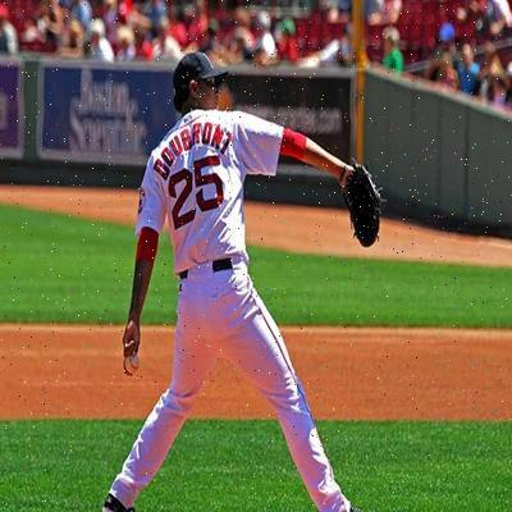

In [126]:
atk_1p_sample_ind_path = os.path.join(atk_1p_sample_path, atk_1p_sample_list[0])
atk_1p_sample_ind_image = Image.open(atk_1p_sample_ind_path).resize((512, 512))
atk_1p_sample_ind_image.show()

In [127]:
atk_1p_sample_result = test_only_check(atk_1p_sample_ind_path)

{'plagiarism': True, 'orig_img_cid': 'QmQHPneTmZ7hvFApPgrejsgsxyHofPaPuzpBjRUfX3oEUw', 'orig_img_file': '/9j/4AAQSkZJRgABAQEASABIAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAGQAZADASIAAhEBAxEB/8QAHAAAAQUBAQEAAAAAAAAAAAAAAwECBAUGAAcI/8QAPhAAAgEDAwIFAQUGBAYDAQEAAQIDAAQRBRIhMUEGEyJRYXEUMoGRoQcVI0JSsSRiwdEWM0Ny4fA0U/GCsv/EABoBAAIDAQEAAAAAAAAAAAAAAAABAgMEBQb/xAAxEQACAgEEAQMEAQIHAAMAAAAAAQIDEQQSITFBBRNRFBUiUjJhcSMkQoGRscE0YvD/2gAMAwEAAhEDEQA/AMJe6Q2nguvKHrmq61Vi7sqZyOc1fX+qJfWD+jAPGQOKorO4RGZXOBWWDcuD1eojWpbq+hsCfxiCoBxzmmJaiS4wR3yRRZjulOwEgjHHapdkxkUrDGXk/pA5qzkw2uGPyDtB5MKNk8EHHtWpu4bm48LkW7nG0ZPuBzis/c6VfQ6NJcPwygFkI6VdeDtXa60OS2mIfZ0PfHtVG5xW5dlMYxlLb4ZmlmmtrY+cpAPf59qn+H4zFqkM843AkAg/NSLryZ5XgAB2uc8fpT7iM28sBVSMsDz0P0rpUyVslvOdqIOpf4ZrPG/h23uNEWaGNd4XcjAV5BLASVO3GPjvXsupahv8OCFjlgB9c15d+6NSeGSdLKXyQSc+1GqjsawLRyjNfmy/8N69e2M8UEBG0j1E9hUm7tE

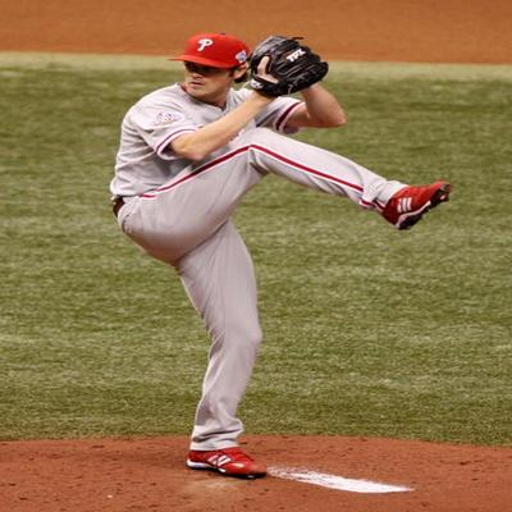

In [128]:
orig_sample_ind_path = os.path.join(orig_sample_path, orig_sample_list[19])
orig_sample_ind_image = Image.open(orig_sample_ind_path).resize((512, 512))
orig_sample_ind_image.show()

In [64]:
orig_sample_result = test_force_register(orig_sample_ind_path)

{'plagiarism': False, 'orig_img_cid': None, 'orig_img_file': None, 'probability': None, 'new_img_cid': 'Qmez5TtAPDpjmMBvj2Wdn6R54vaGKQEqgK2CaCjuZDBYLA'}


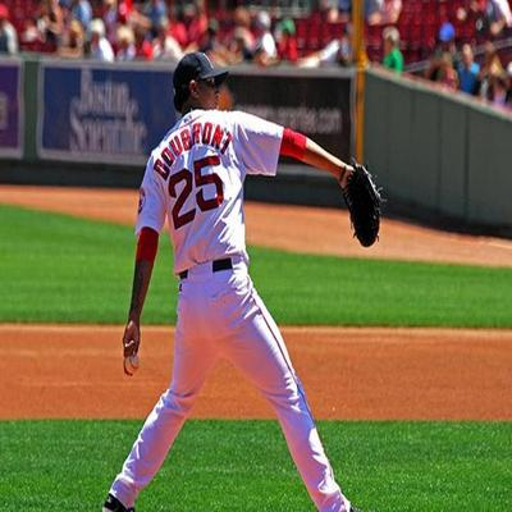

In [59]:
plag_img_data = base64.b64decode(orig_sample_result["orig_img_file"])
plag_img = Image.open(BytesIO(plag_img_data)).resize((512, 512))
plag_img.show()

## 리셋 (Azuki, BAYC, CryptoPunks를 제외한 새로운 등록 이미지 삭제)

In [93]:
test_reset()

{'status': 'reset successful'}
